In [1]:
import pandas as pd
import importlib

import sys
sys.path.append('../')

import importlib
import mia
import utils
importlib.reload(mia)
importlib.reload(utils)

from utils import *
from mia import *

In [2]:
k_values = list(range(0,144000,1000))

loss_columns = [f'loss_{k}' for k in k_values]

target_fpr = 0.01

CB_color_cycle = ['#377eb8', '#4daf4a','#f781bf',
                '#a65628','#ff7f00', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

## Wikipedia Pythia 160M (Pile-RS-Truncated)

In [3]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_wiki_pythia160m = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/wiki/pythia160m_processed/pile_reservoirv2_wiki_seqlen{seqlen}_pythia-160m_processed.pkl", "rb") as f:
        dataset_wiki_pythia160m[seqlen] = pd.read_pickle(f)


In [4]:
dataset_wiki_pythia160m["seq_len=64"] = dataset_wiki_pythia160m.pop(64)
dataset_wiki_pythia160m["seq_len=128"] = dataset_wiki_pythia160m.pop(128)
dataset_wiki_pythia160m["seq_len=256"] = dataset_wiki_pythia160m.pop(256)
dataset_wiki_pythia160m["seq_len=512"] = dataset_wiki_pythia160m.pop(512)
dataset_wiki_pythia160m["seq_len=1024"] = dataset_wiki_pythia160m.pop(1024)
dataset_wiki_pythia160m["seq_len=2048"] = dataset_wiki_pythia160m.pop(2048)

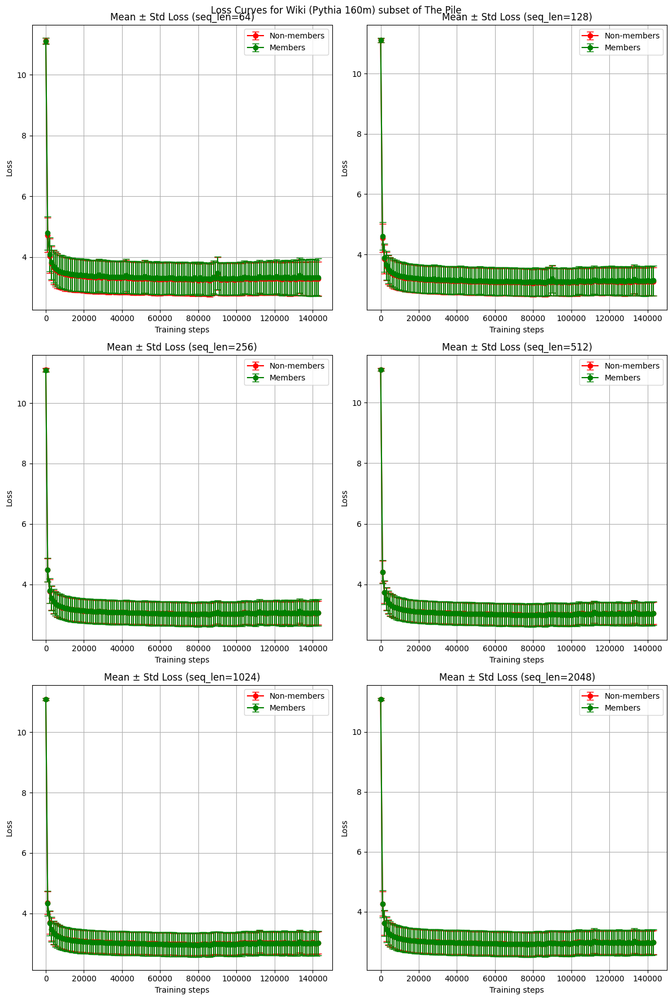

In [5]:
plot_loss_curves(dataset_wiki_pythia160m, "Wiki (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


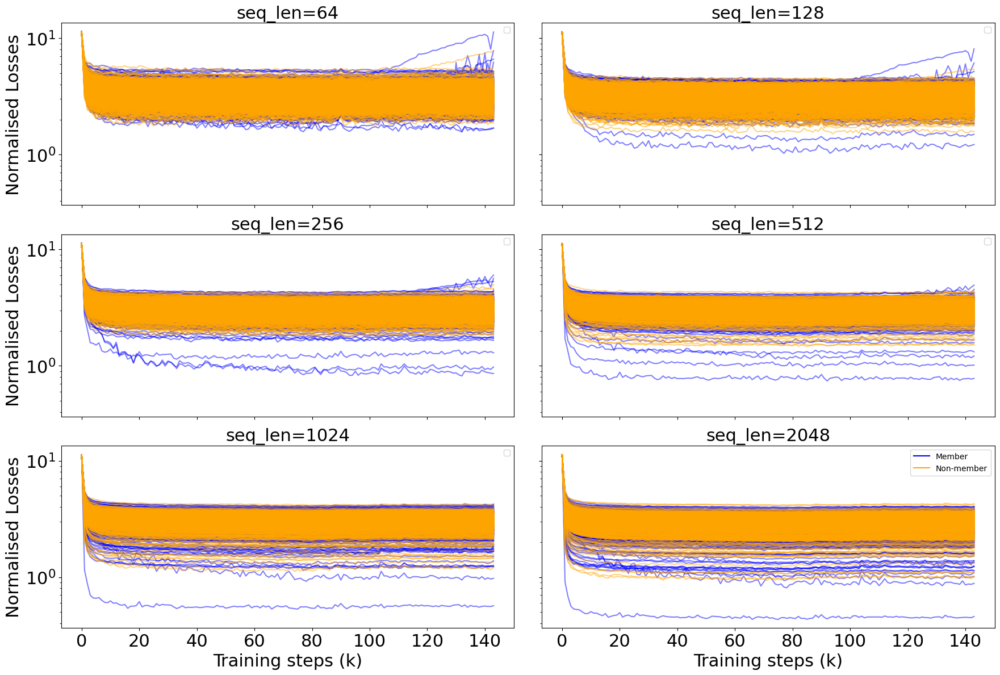

In [6]:
plot_indv_loss_curves(dataset_wiki_pythia160m, k_values, dataset_name="Wikipedia (Pythia 160m)")

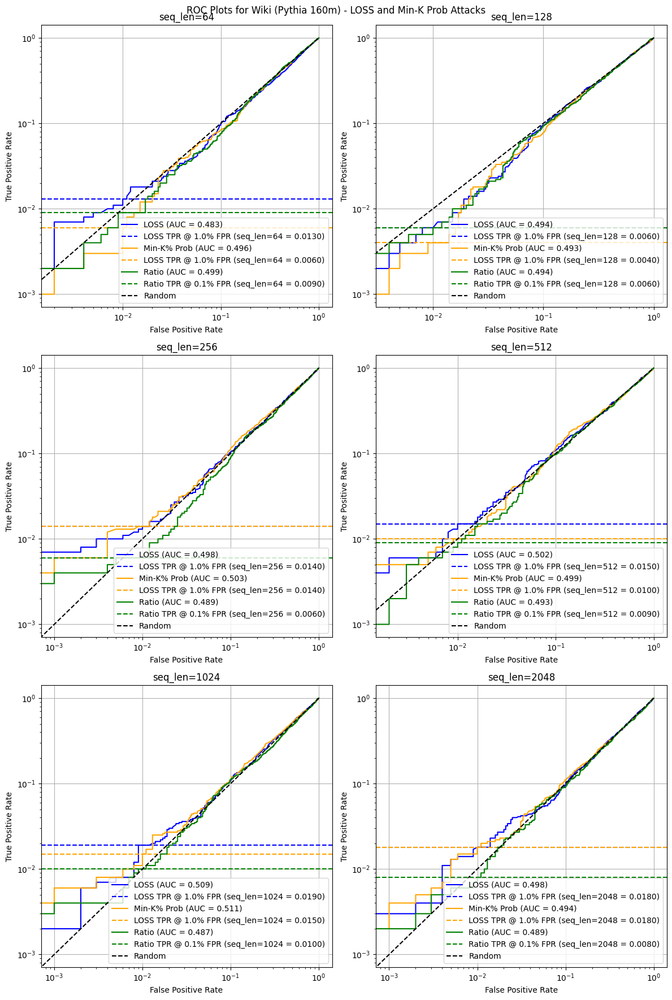

In [7]:
wiki_loss_aucs, wiki_loss_tpr_at_target, wiki_minkprob_aucs, wiki_minkprob_tpr_at_target, wiki_ratio_aucs, wiki_ratio_tpr_at_target = plot_roc_curves(dataset_wiki_pythia160m, "Wiki (Pythia 160m)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

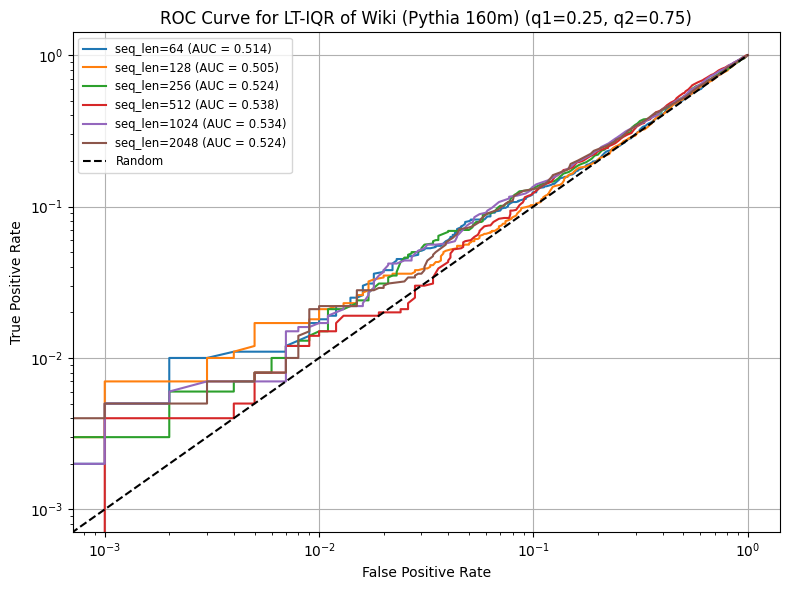

In [8]:
wiki_144_cp_aucs, wiki_144_cp_tpr = plot_roc_iqr_single_plot(dataset_wiki_pythia160m, loss_columns, "Wiki (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

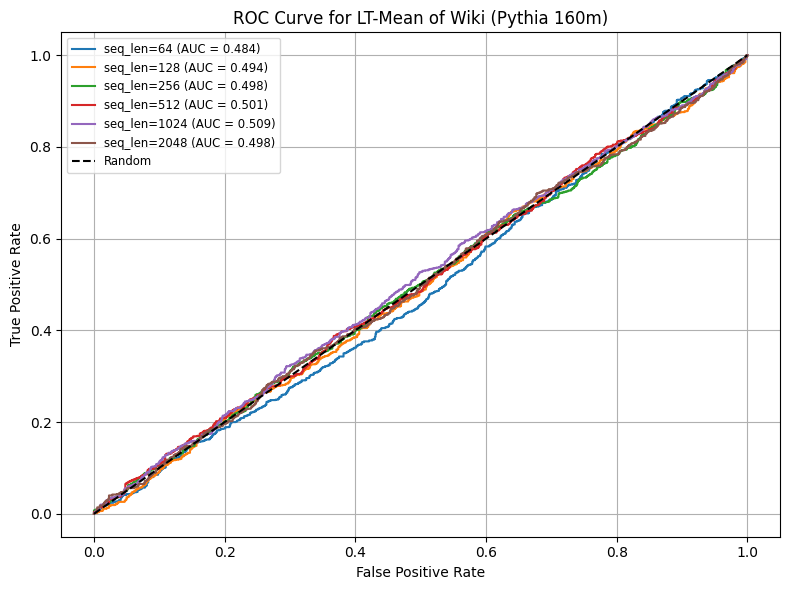

In [9]:
wiki_144_cp_mean_aucs, wiki_144_cp_mean_tprs = plot_loss_trace_mean(dataset_wiki_pythia160m, loss_columns, "Wiki (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniqu

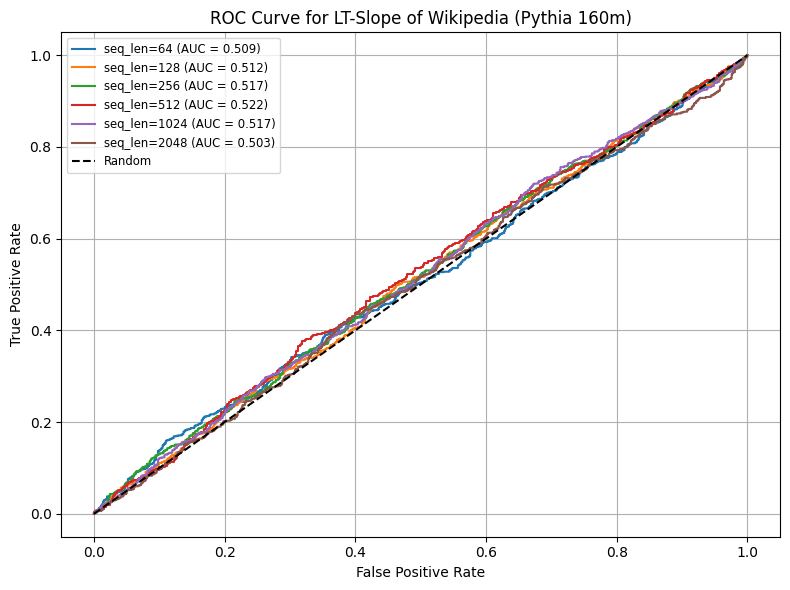

In [10]:
wiki_144_cp_slope_aucs, wiki_144_cp_slope_tpr = plot_loss_trace_slope(dataset_wiki_pythia160m, loss_columns, "Wikipedia (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

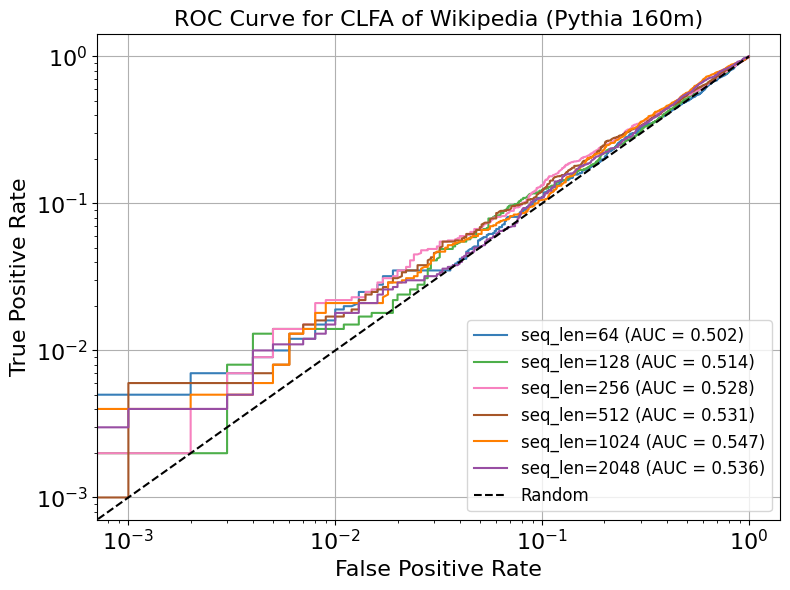

In [11]:
wiki_144_cp_clfa_aucs, wiki_144_cp_clfa_tprs = plot_clfa_normalized(dataset_wiki_pythia160m, loss_columns, "Wikipedia (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documen

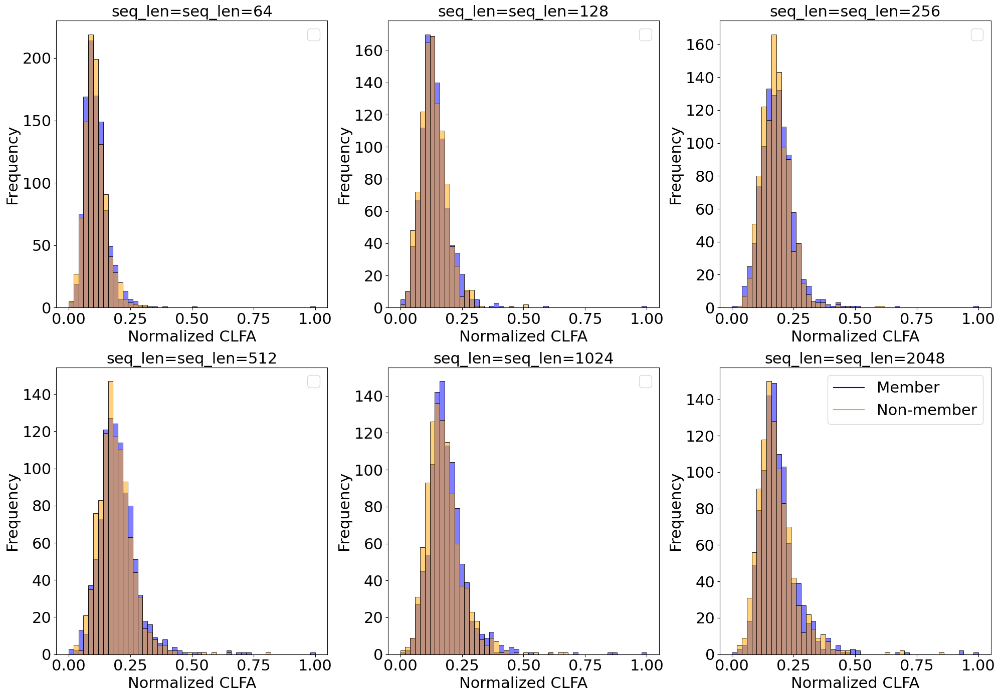

In [12]:
plot_clfa_norm_distribution(dataset_wiki_pythia160m, "Wiki (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/che

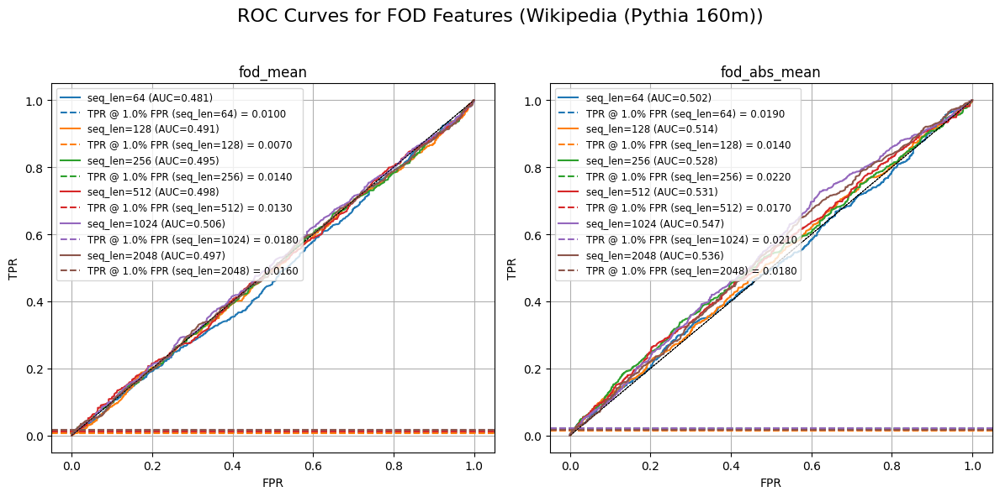

In [13]:
wiki_144_fod_mean, wiki_144_fod_mean_tpr, wiki_144_fod_abs_mean, wiki_144_fod_abs_mean_tpr = plot_fod(dataset_wiki_pythia160m, "Wikipedia (Pythia 160m)", loss_columns, target_fpr)

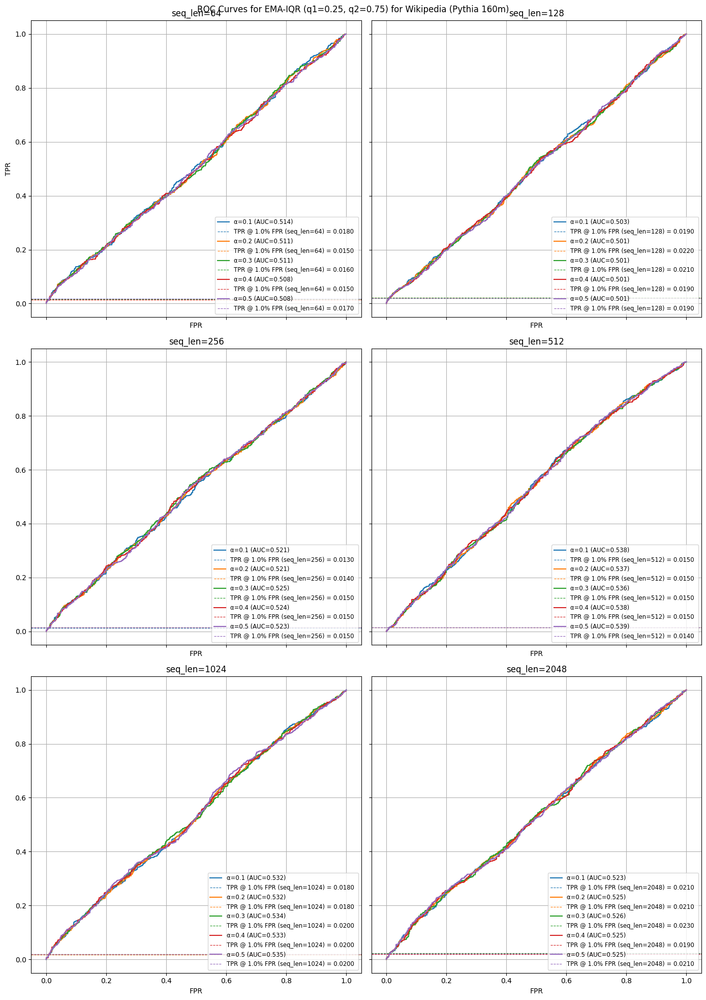

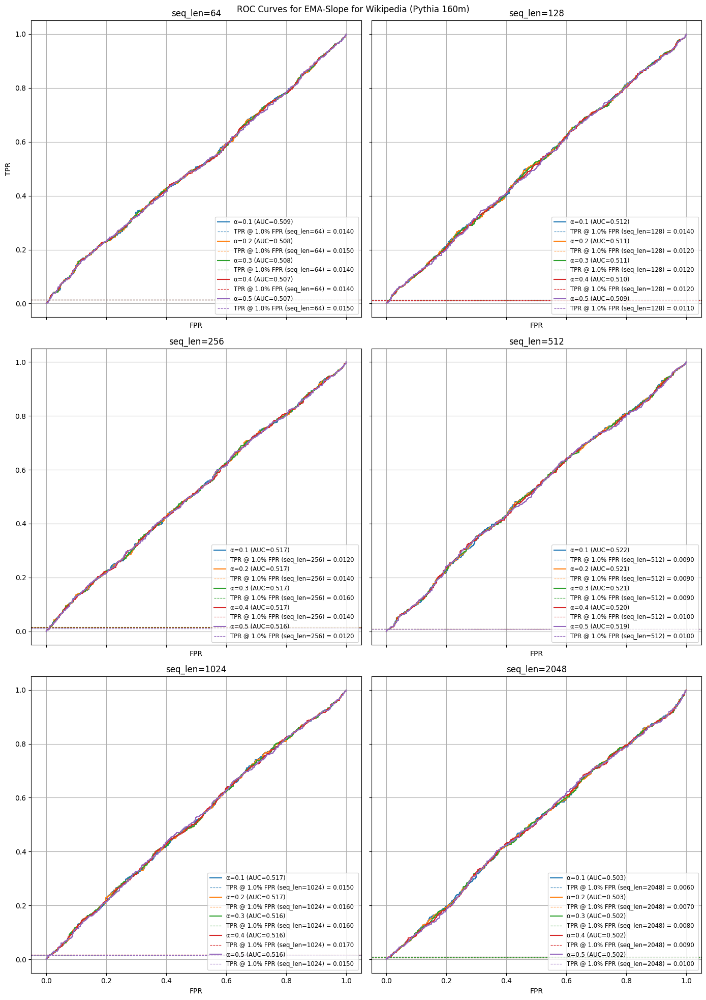

In [14]:
dataset_ema_wiki_144_pythia160m = {}
wiki_144_cp_ema_iqr_aucs, wiki_144_cp_ema_iqr_tprs, wiki_144_cp_ema_slope_aucs, wiki_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_wiki_pythia160m, dataset_ema_wiki_144_pythia160m, "Wikipedia (Pythia 160m)", loss_columns, target_fpr)

### Normalised Loss Traces (Wiki 160M)

In [15]:
dataset_wiki_pythia160m_normalised = normalize_loss_dfs(dataset_wiki_pythia160m, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


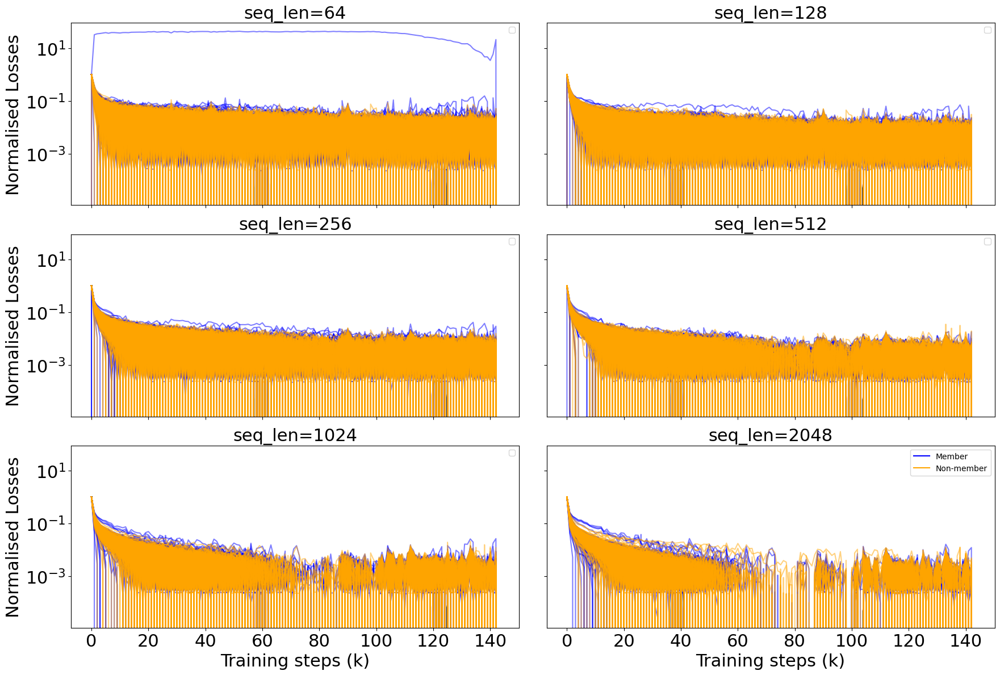

In [16]:
plot_indv_loss_curves(dataset_wiki_pythia160m_normalised, k_values, "Wiki Normalised Losses (Pythia 160m)")

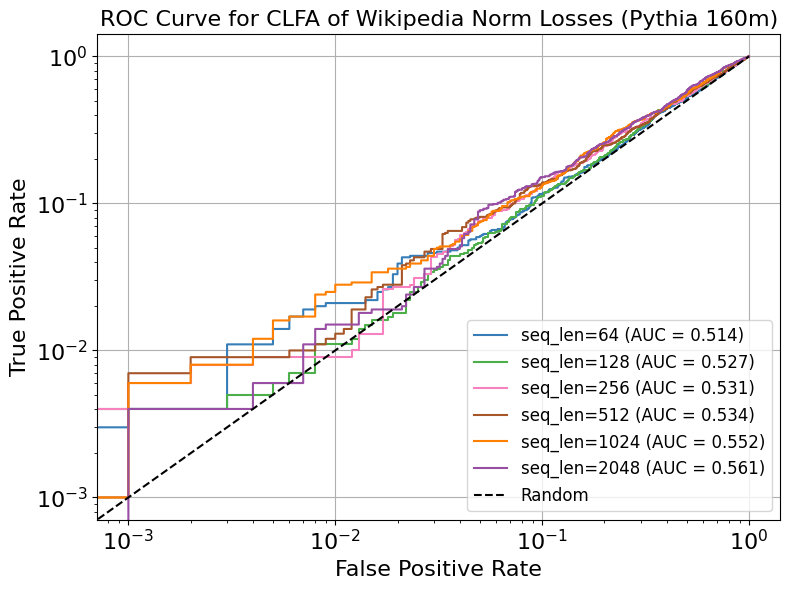

In [17]:
wiki_144_cp_norm_clfa_aucs, wiki_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_wiki_pythia160m_normalised, loss_columns, "Wikipedia Norm Losses (Pythia 160m)", target_fpr, True)

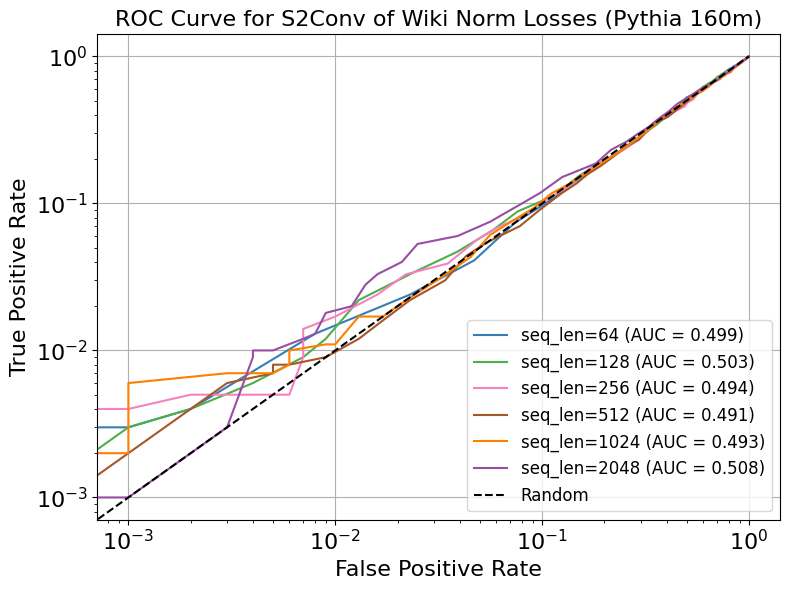

In [18]:
wiki_144_cp_norm_s2conv_aucs, wiki_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_wiki_pythia160m_normalised, loss_columns, "Wiki Norm Losses (Pythia 160m)", target_fpr )

## PubMed Central Pythia 160M (Pile-RS-Truncated)

In [51]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_pubmedc_pythia160m = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/pubmedc/pythia160m_processed/pile_reservoirv2_pubmedc_seqlen{seqlen}_pythia-160m_processed.pkl", "rb") as f:
        dataset_pubmedc_pythia160m[seqlen] = pd.read_pickle(f)


In [52]:
dataset_pubmedc_pythia160m["seq_len=64"] = dataset_pubmedc_pythia160m.pop(64)
dataset_pubmedc_pythia160m["seq_len=128"] = dataset_pubmedc_pythia160m.pop(128)
dataset_pubmedc_pythia160m["seq_len=256"] = dataset_pubmedc_pythia160m.pop(256)
dataset_pubmedc_pythia160m["seq_len=512"] = dataset_pubmedc_pythia160m.pop(512)
dataset_pubmedc_pythia160m["seq_len=1024"] = dataset_pubmedc_pythia160m.pop(1024)
dataset_pubmedc_pythia160m["seq_len=2048"] = dataset_pubmedc_pythia160m.pop(2048)

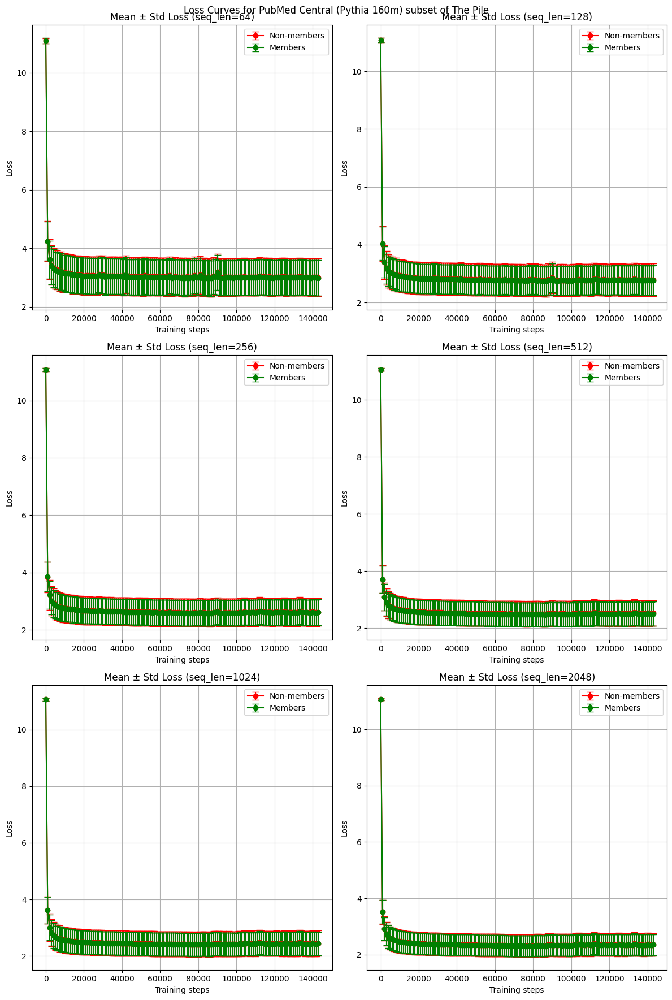

In [53]:
plot_loss_curves(dataset_pubmedc_pythia160m, "PubMed Central (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


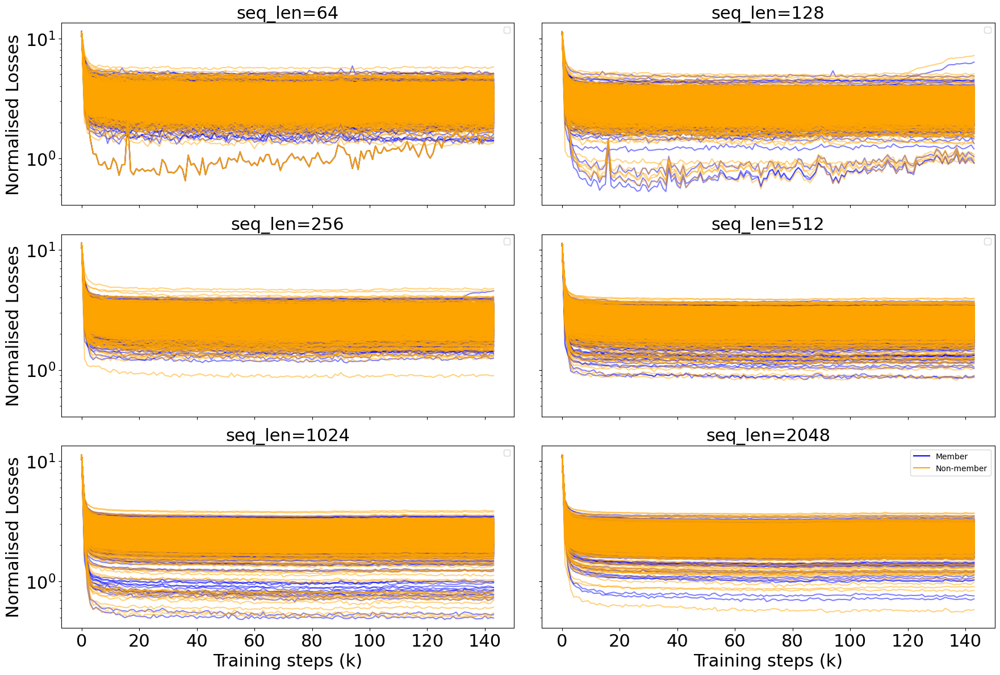

In [54]:
plot_indv_loss_curves(dataset_pubmedc_pythia160m, k_values, dataset_name="PubMed Central (Pythia 160m)")

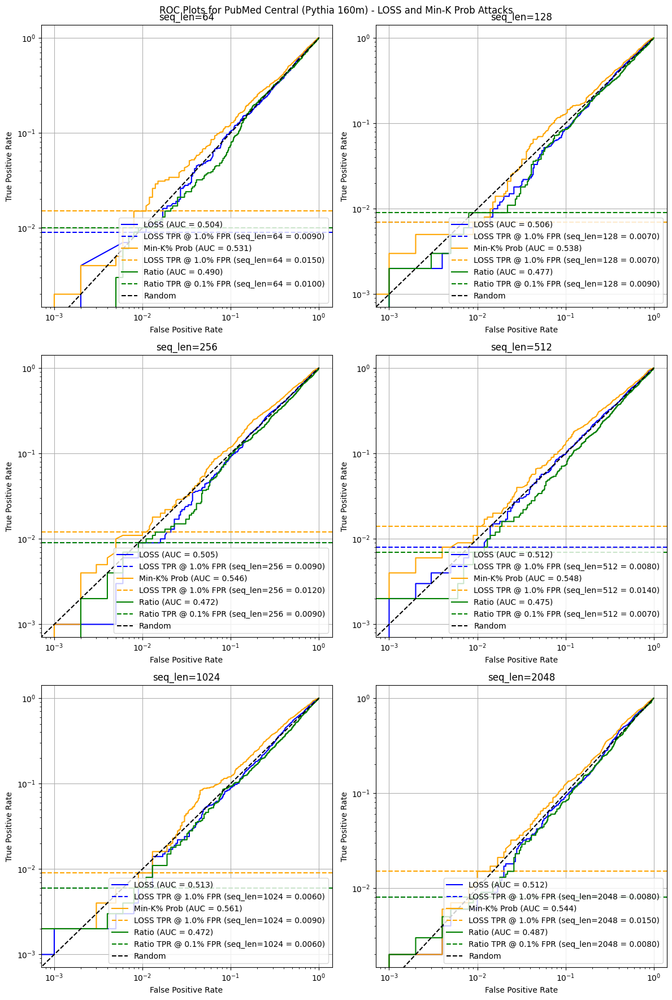

In [55]:
pubmedc_loss_aucs, pubmedc_loss_tpr_at_target, pubmedc_minkprob_aucs, pubmedc_minkprob_tpr_at_target, pubmedc_ratio_aucs, pubmedc_ratio_tpr_at_target = plot_roc_curves(dataset_pubmedc_pythia160m, "PubMed Central (Pythia 160m)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

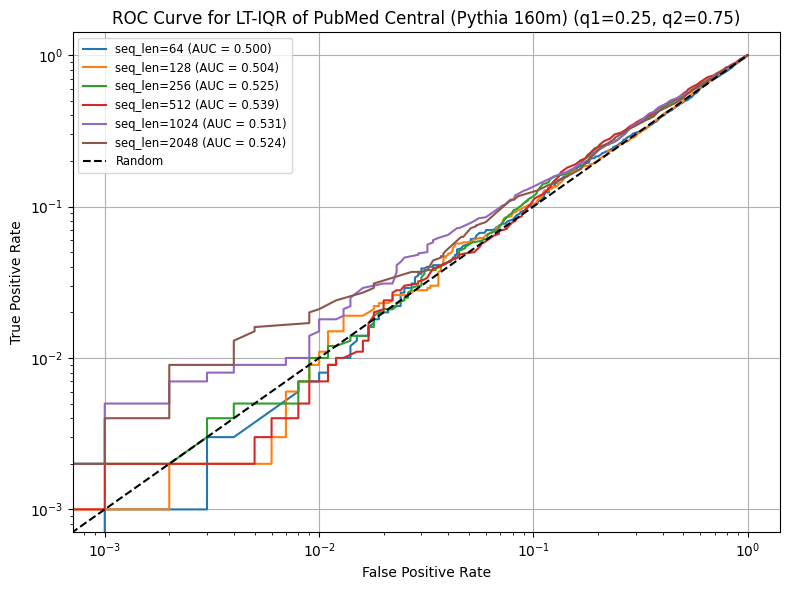

In [56]:
pubmedc_144_cp_aucs, pubmedc_144_cp_tpr = plot_roc_iqr_single_plot(dataset_pubmedc_pythia160m, loss_columns, "PubMed Central (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

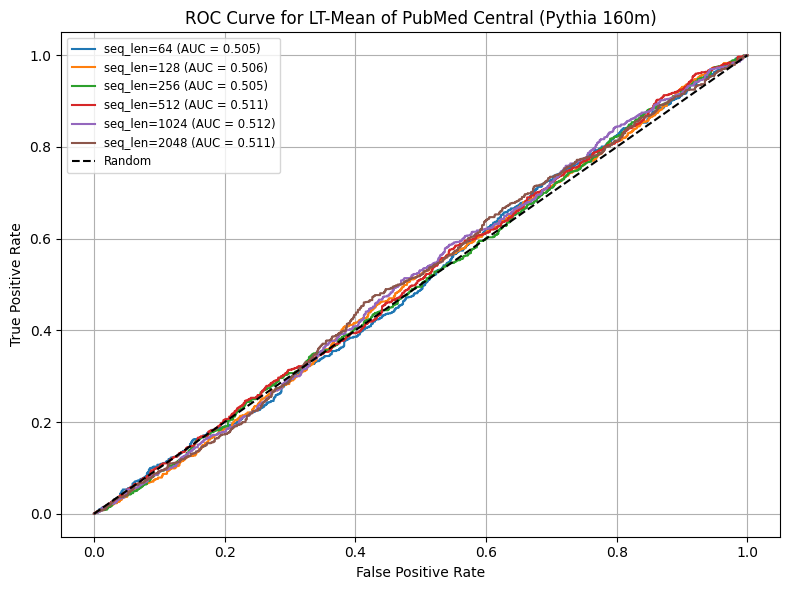

In [57]:
pubmedc_144_cp_mean_aucs, pubmedc_144_cp_mean_tprs = plot_loss_trace_mean(dataset_pubmedc_pythia160m, loss_columns, "PubMed Central (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniqu

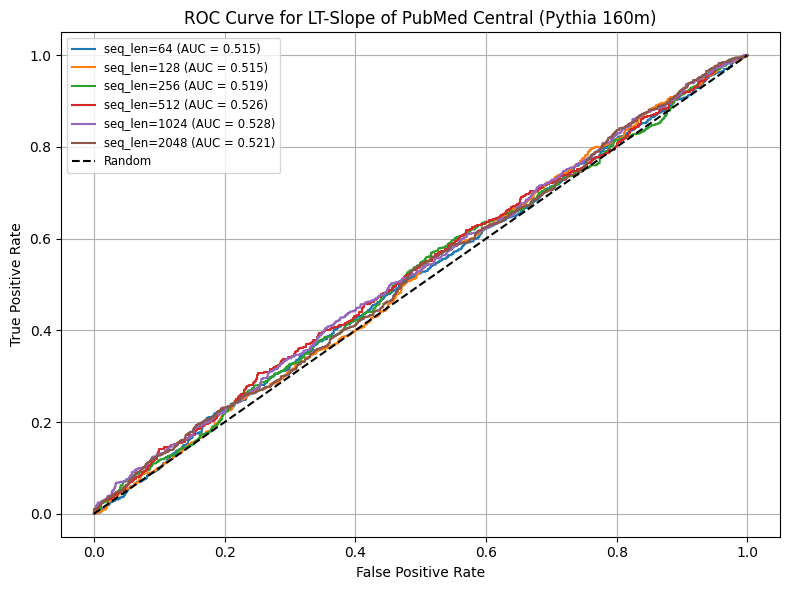

In [58]:
pubmedc_144_cp_slope_aucs, pubmedc_144_cp_slope_tpr = plot_loss_trace_slope(dataset_pubmedc_pythia160m, loss_columns, "PubMed Central (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

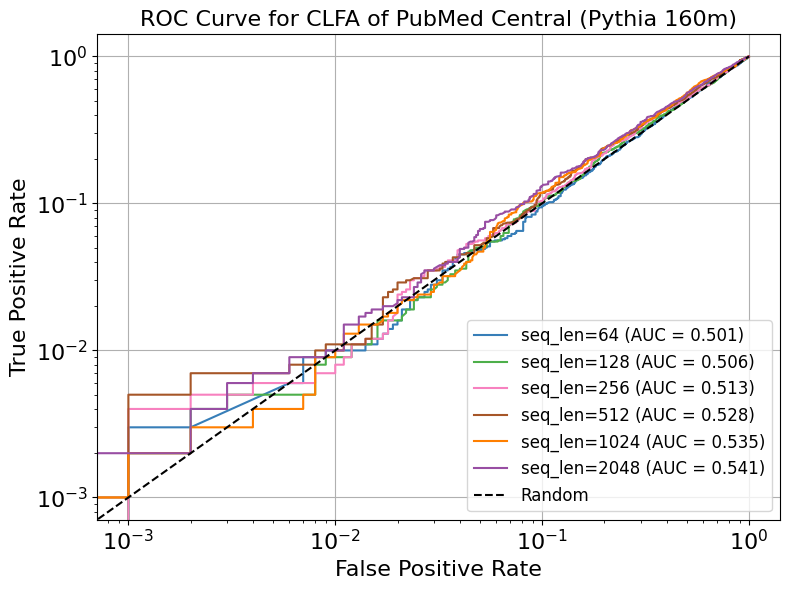

In [59]:
pubmedc_144_cp_clfa_aucs, pubmedc_144_cp_clfa_tprs = plot_clfa_normalized(dataset_pubmedc_pythia160m, loss_columns, "PubMed Central (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documen

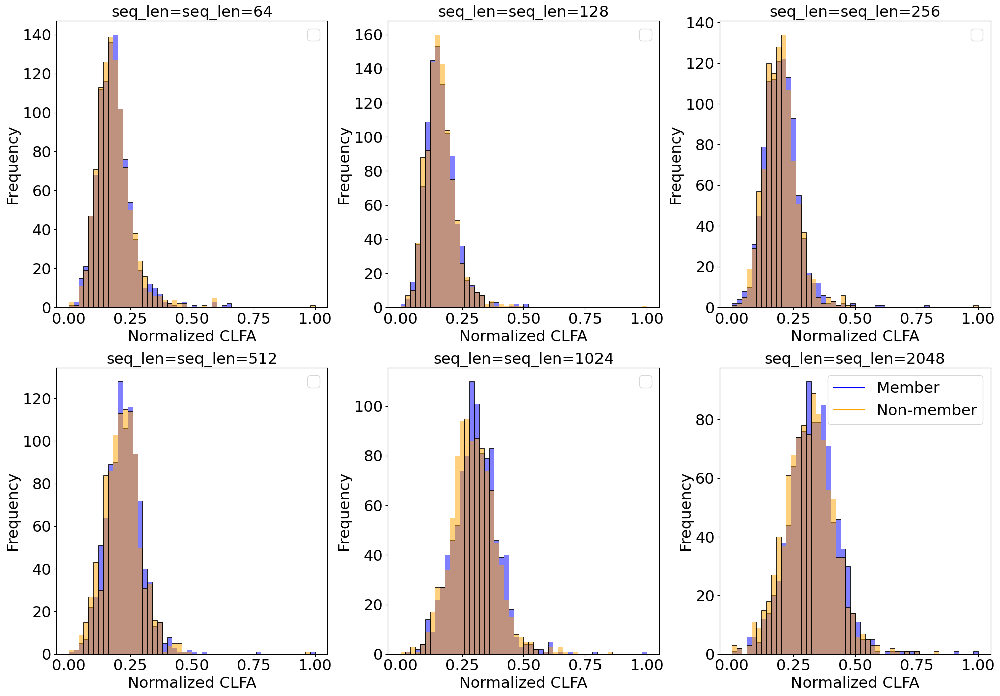

In [60]:
plot_clfa_norm_distribution(dataset_pubmedc_pythia160m, "PubMed Central (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/che

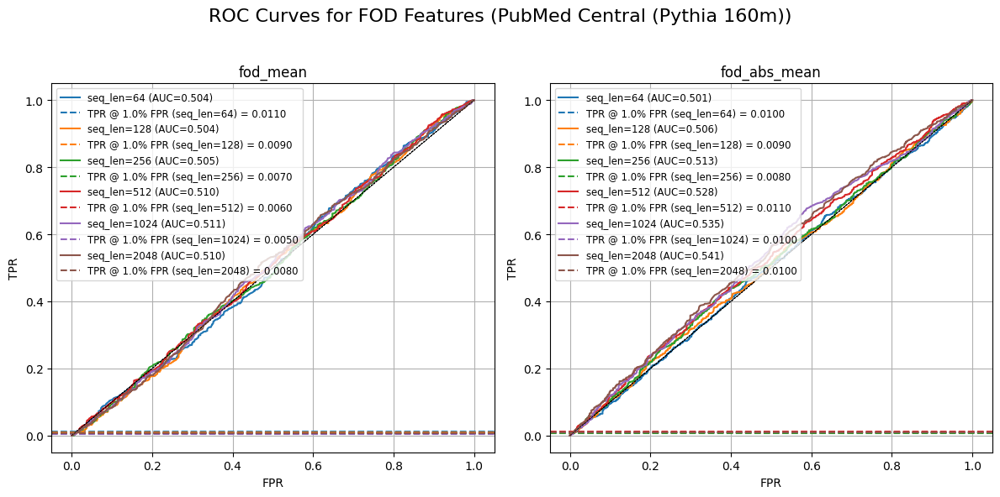

In [61]:
pubmedc_144_fod_mean, pubmedc_144_fod_mean_tpr, pubmedc_144_fod_abs_mean, pubmedc_144_fod_abs_mean_tpr = plot_fod(dataset_pubmedc_pythia160m, "PubMed Central (Pythia 160m)", loss_columns, target_fpr)

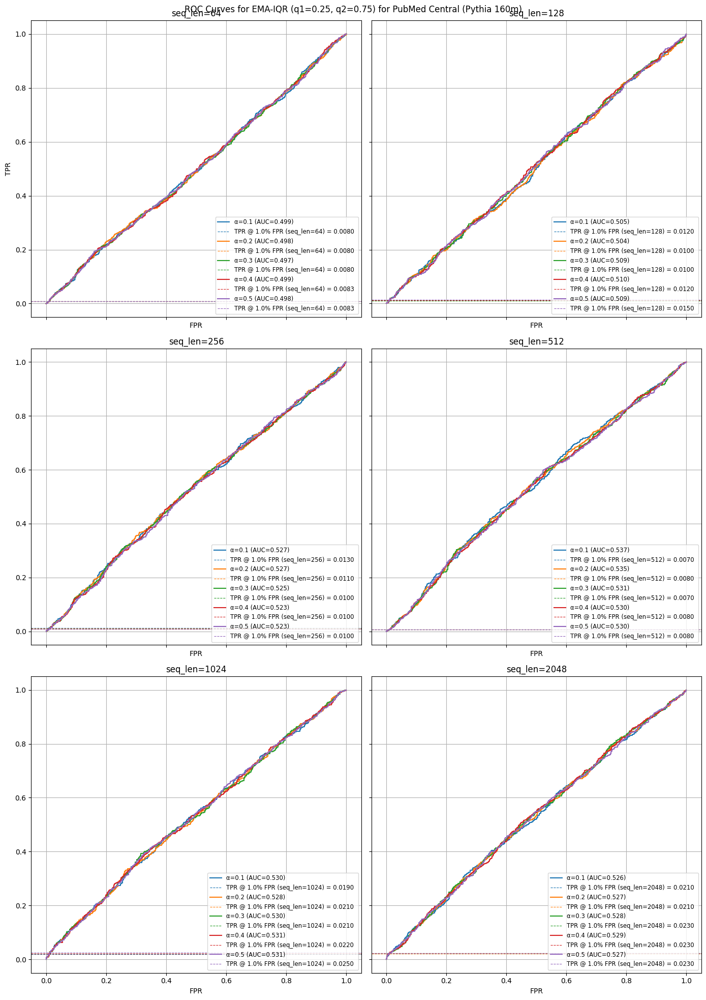

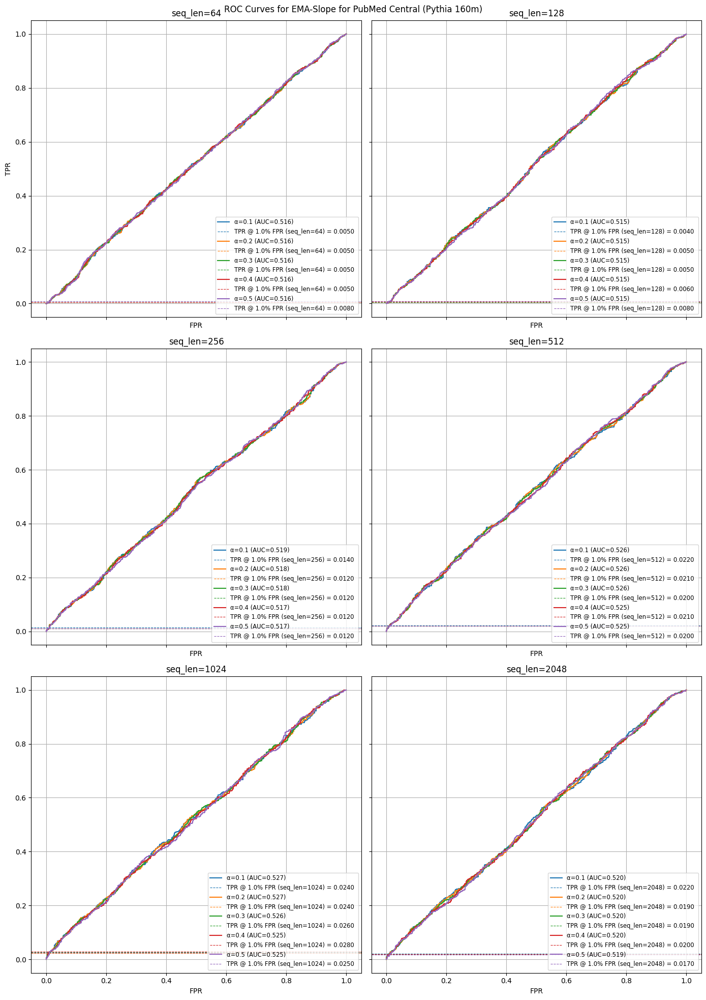

In [62]:
dataset_ema_pubmedc_144_pythia160m = {}
pubmedc_144_cp_ema_iqr_aucs, pubmedc_144_cp_ema_iqr_tprs, pubmedc_144_cp_ema_slope_aucs, pubmedc_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_pubmedc_pythia160m, dataset_ema_pubmedc_144_pythia160m, "PubMed Central (Pythia 160m)", loss_columns, target_fpr)

### Normalised Loss Traces (PubMed Central 160M)

In [63]:
dataset_pubmedc_pythia160m_normalised = normalize_loss_dfs(dataset_pubmedc_pythia160m, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
/Users/ongsici/anaconda3/envs/peft_mia/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


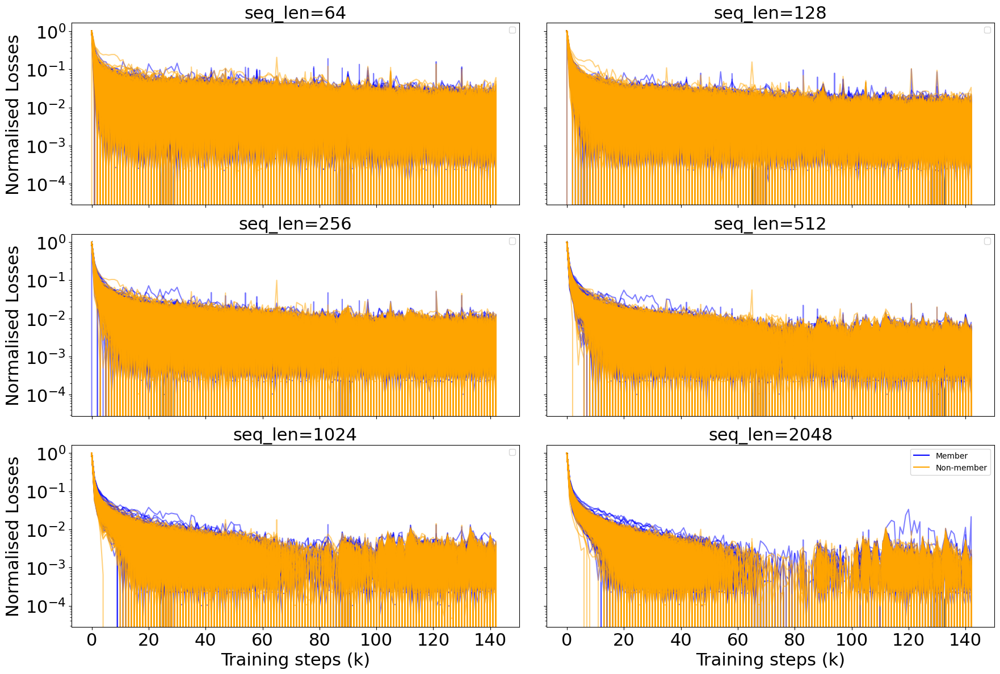

In [64]:
plot_indv_loss_curves(dataset_pubmedc_pythia160m_normalised, k_values, "PubMed Central Normalised Losses (Pythia 160m)")

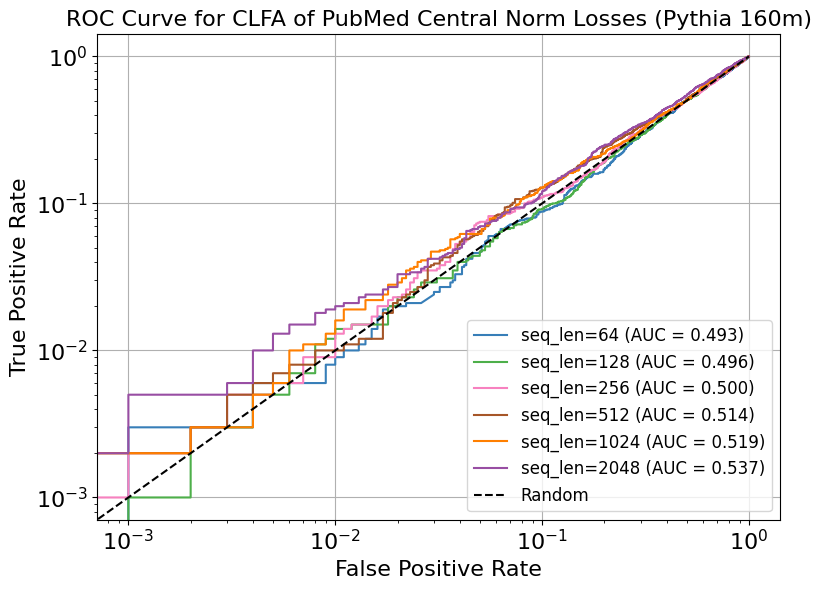

In [65]:
pubmedc_144_cp_norm_clfa_aucs, pubmedc_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_pubmedc_pythia160m_normalised, loss_columns, "PubMed Central Norm Losses (Pythia 160m)", target_fpr, True)

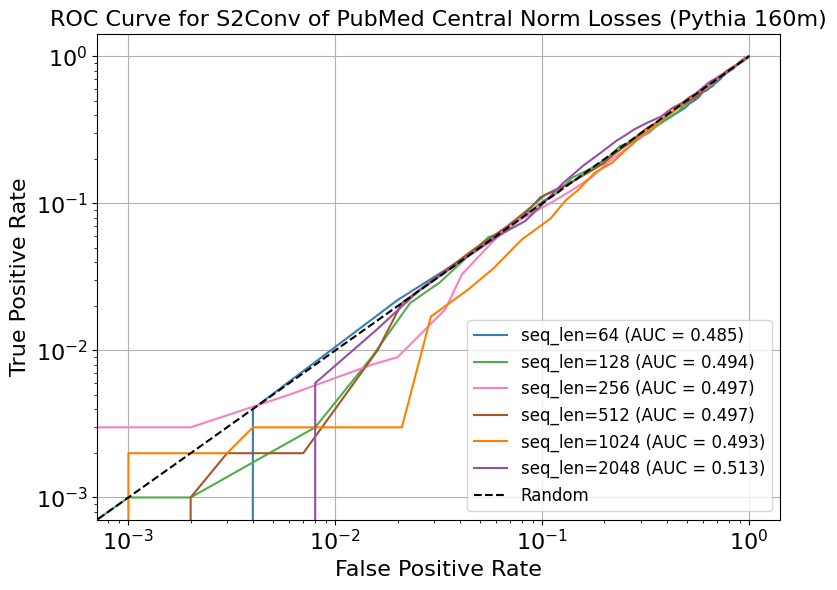

In [66]:
pubmedc_144_cp_norm_s2conv_aucs, pubmedc_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_pubmedc_pythia160m_normalised, loss_columns, "PubMed Central Norm Losses (Pythia 160m)", target_fpr )

## USPTO Pythia 160M (Pile-RS-Truncated)

In [67]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_uspto_pythia160m = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/uspto/pythia160m_processed/pile_reservoirv2_uspto_seqlen{seqlen}_pythia-160m_processed.pkl", "rb") as f:
        dataset_uspto_pythia160m[seqlen] = pd.read_pickle(f)


In [68]:
dataset_uspto_pythia160m["seq_len=64"] = dataset_uspto_pythia160m.pop(64)
dataset_uspto_pythia160m["seq_len=128"] = dataset_uspto_pythia160m.pop(128)
dataset_uspto_pythia160m["seq_len=256"] = dataset_uspto_pythia160m.pop(256)
dataset_uspto_pythia160m["seq_len=512"] = dataset_uspto_pythia160m.pop(512)
dataset_uspto_pythia160m["seq_len=1024"] = dataset_uspto_pythia160m.pop(1024)
dataset_uspto_pythia160m["seq_len=2048"] = dataset_uspto_pythia160m.pop(2048)

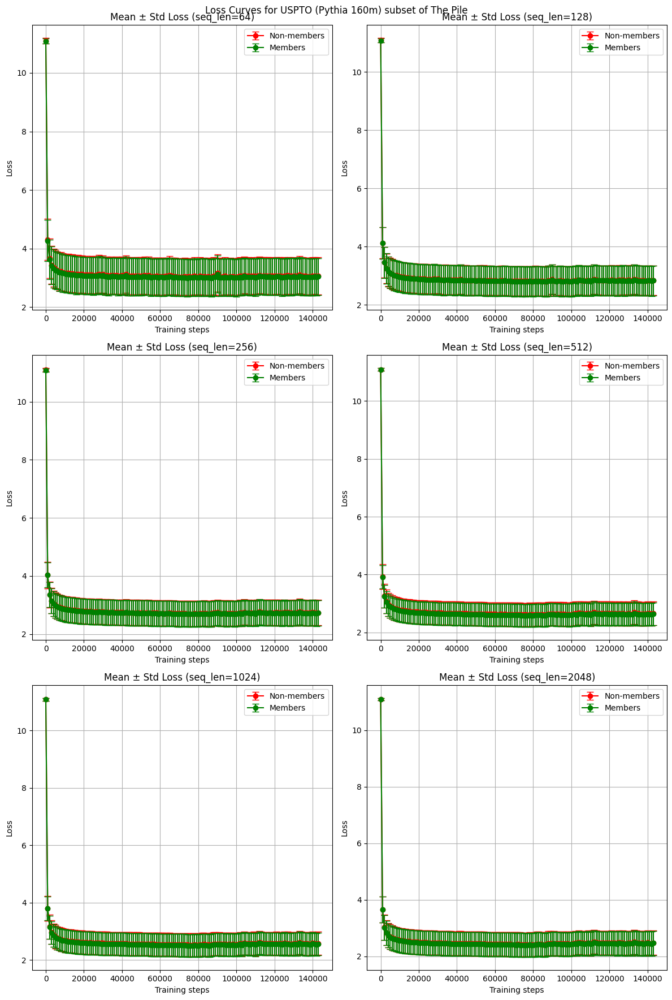

In [69]:
plot_loss_curves(dataset_uspto_pythia160m, "USPTO (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


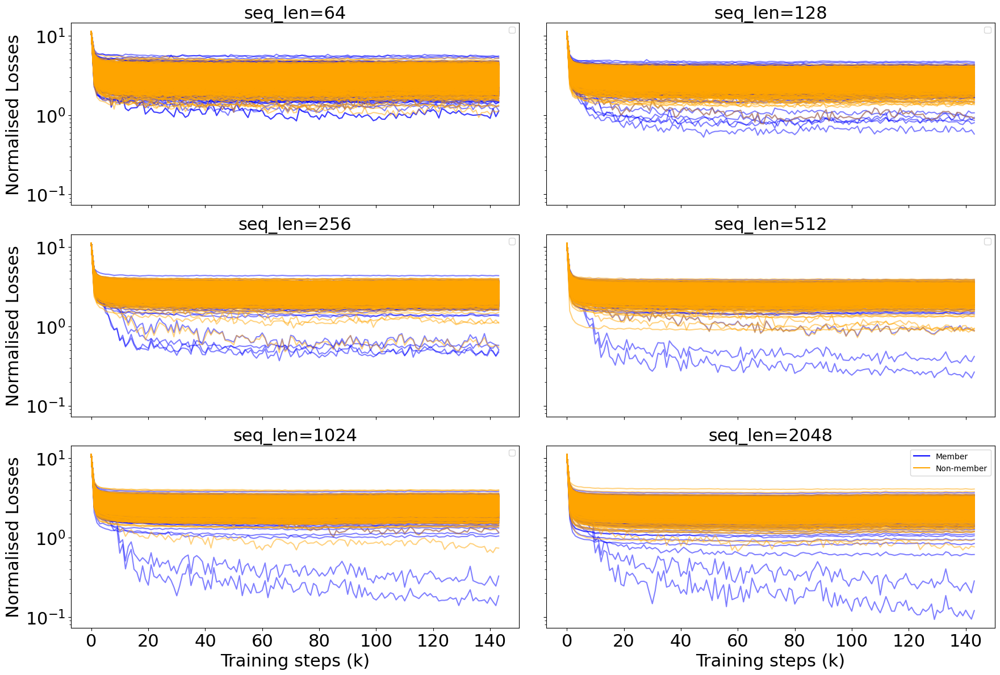

In [70]:
plot_indv_loss_curves(dataset_uspto_pythia160m, k_values, dataset_name="USPTO (Pythia 160m)")

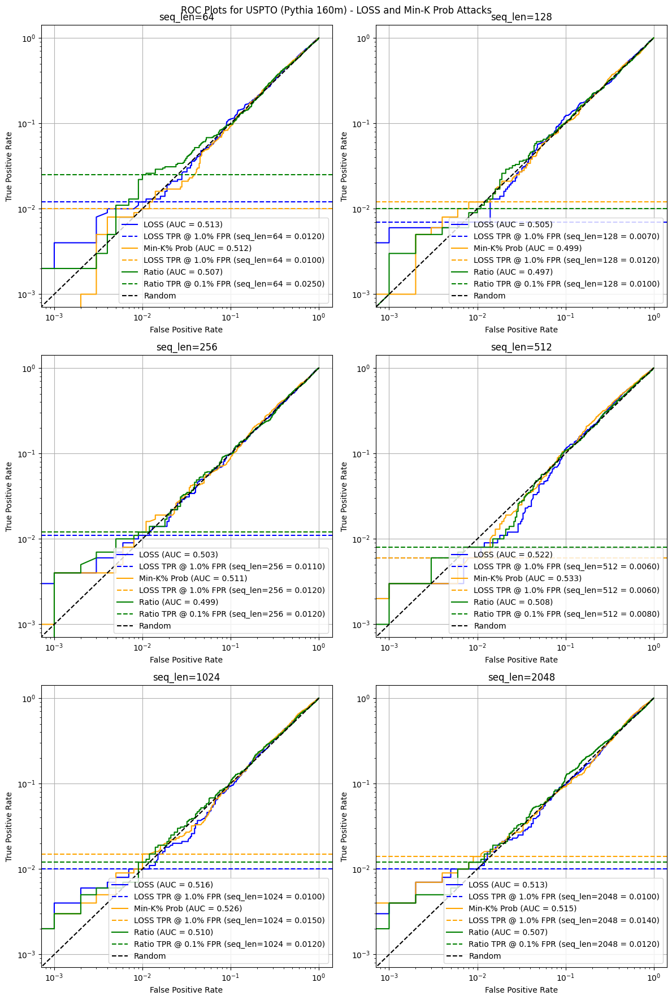

In [71]:
uspto_loss_aucs, uspto_loss_tpr_at_target, uspto_minkprob_aucs, uspto_minkprob_tpr_at_target, uspto_ratio_aucs, uspto_ratio_tpr_at_target = plot_roc_curves(dataset_uspto_pythia160m, "USPTO (Pythia 160m)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

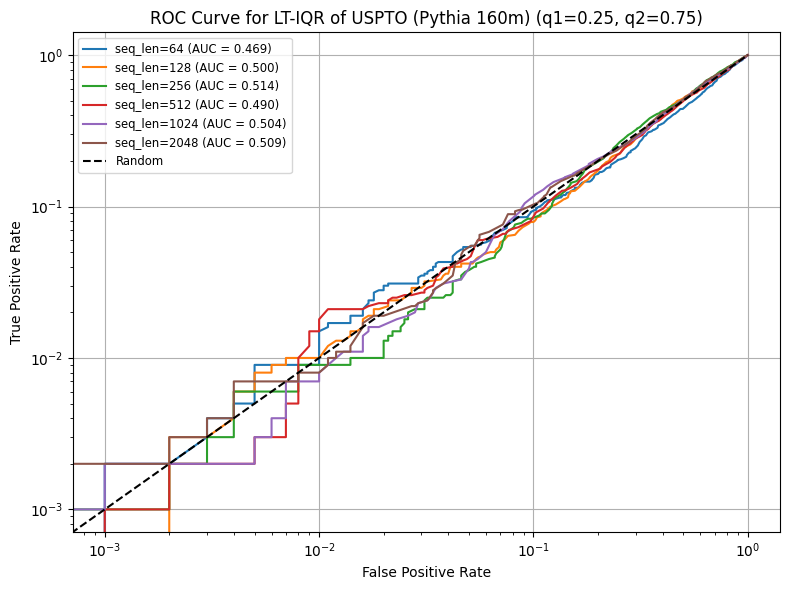

In [72]:
uspto_144_cp_aucs, uspto_144_cp_tpr = plot_roc_iqr_single_plot(dataset_uspto_pythia160m, loss_columns, "USPTO (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

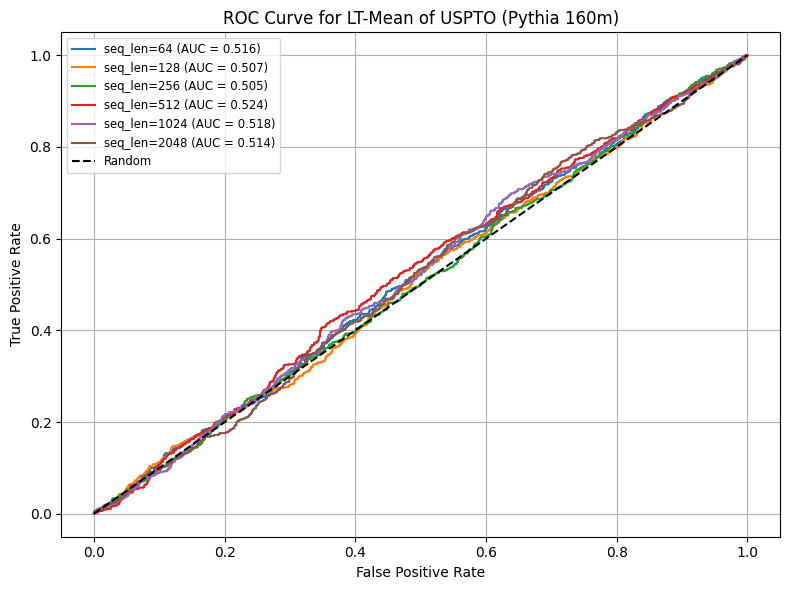

In [73]:
uspto_144_cp_mean_aucs, uspto_144_cp_mean_tprs = plot_loss_trace_mean(dataset_uspto_pythia160m, loss_columns, "USPTO (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniqu

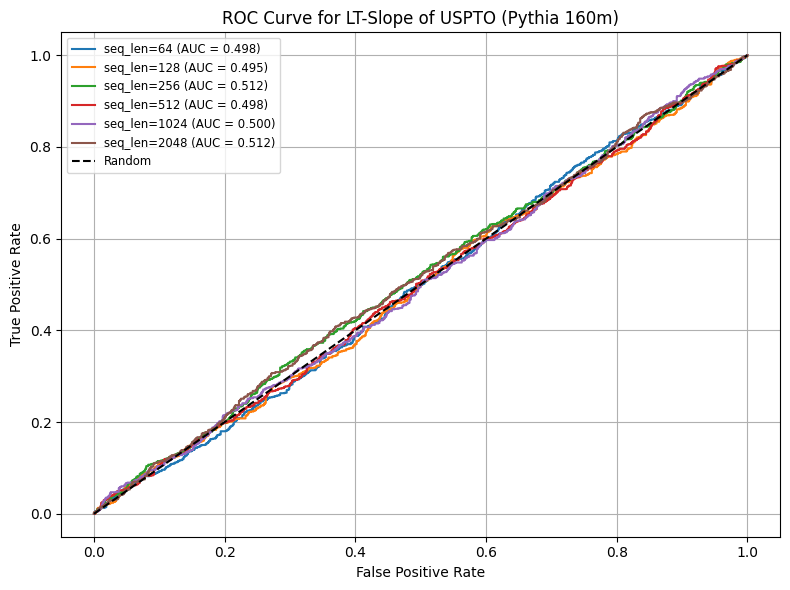

In [74]:
uspto_144_cp_slope_aucs, uspto_144_cp_slope_tpr = plot_loss_trace_slope(dataset_uspto_pythia160m, loss_columns, "USPTO (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

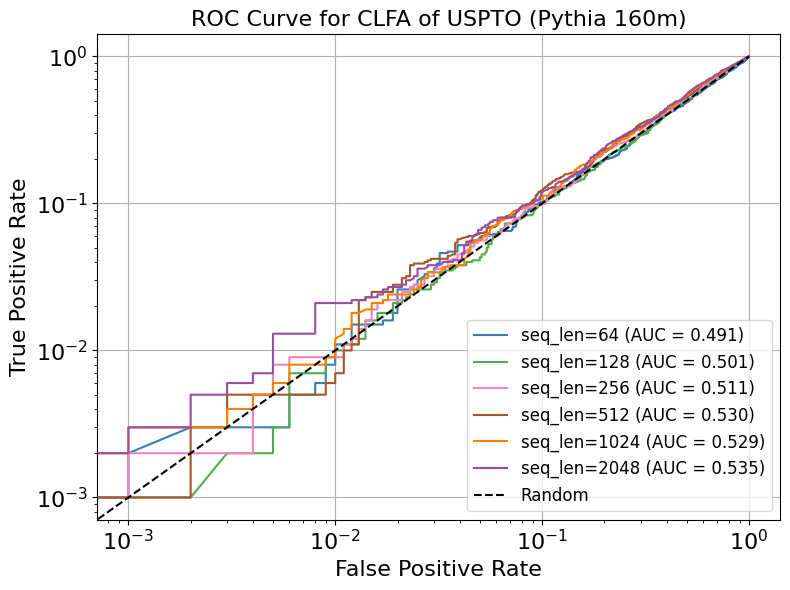

In [75]:
uspto_144_cp_clfa_aucs, uspto_144_cp_clfa_tprs = plot_clfa_normalized(dataset_uspto_pythia160m, loss_columns, "USPTO (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documen

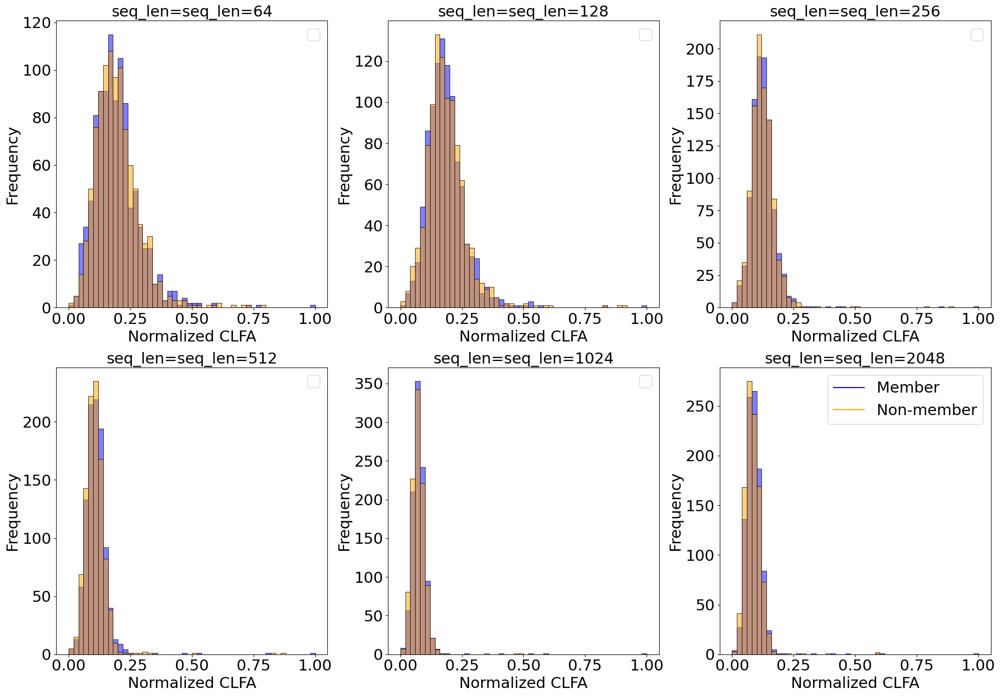

In [76]:
plot_clfa_norm_distribution(dataset_uspto_pythia160m, "USPTO (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/che

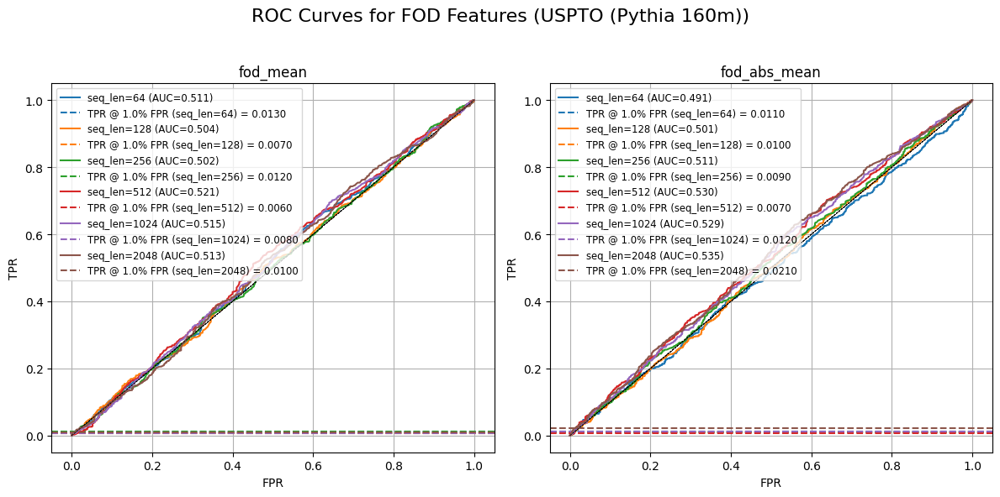

In [77]:
uspto_144_fod_mean, uspto_144_fod_mean_tpr, uspto_144_fod_abs_mean, uspto_144_fod_abs_mean_tpr = plot_fod(dataset_uspto_pythia160m, "USPTO (Pythia 160m)", loss_columns, target_fpr)

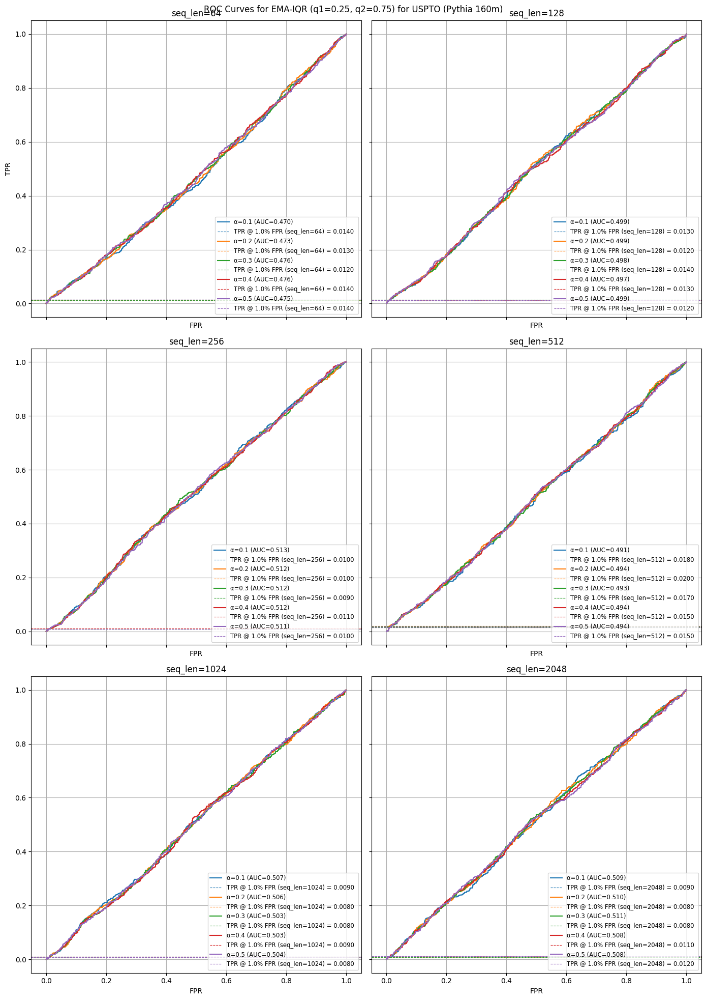

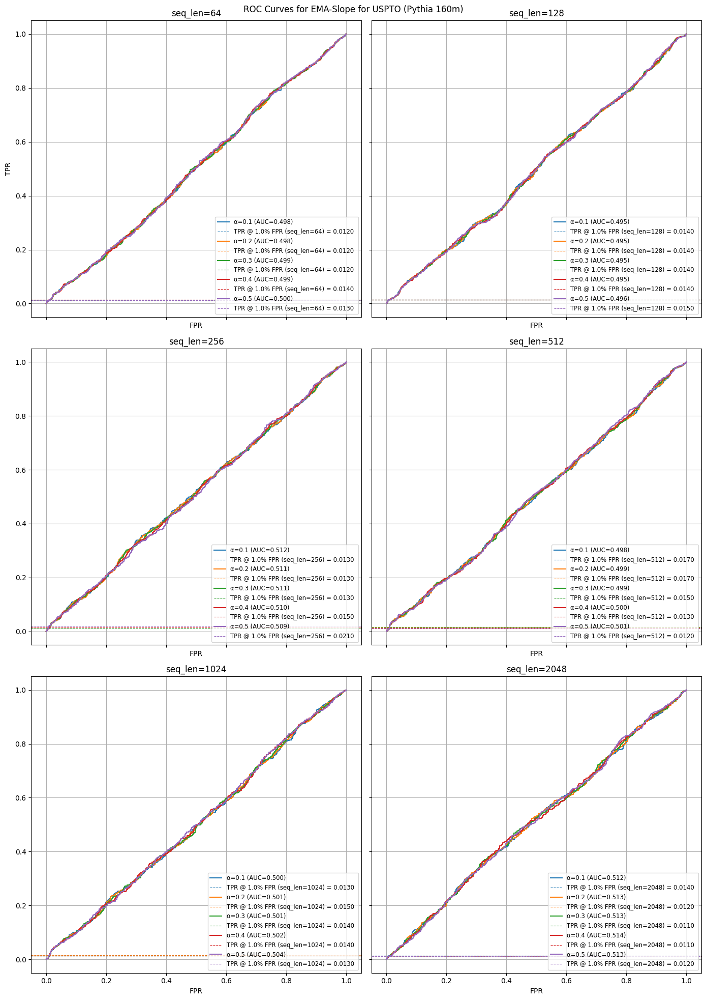

In [78]:
dataset_ema_uspto_144_pythia160m = {}
uspto_144_cp_ema_iqr_aucs, uspto_144_cp_ema_iqr_tprs, uspto_144_cp_ema_slope_aucs, uspto_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_uspto_pythia160m, dataset_ema_uspto_144_pythia160m, "USPTO (Pythia 160m)", loss_columns, target_fpr)

### Normalised Loss Traces (USPTO 160M)

In [79]:
dataset_uspto_pythia160m_normalised = normalize_loss_dfs(dataset_uspto_pythia160m, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


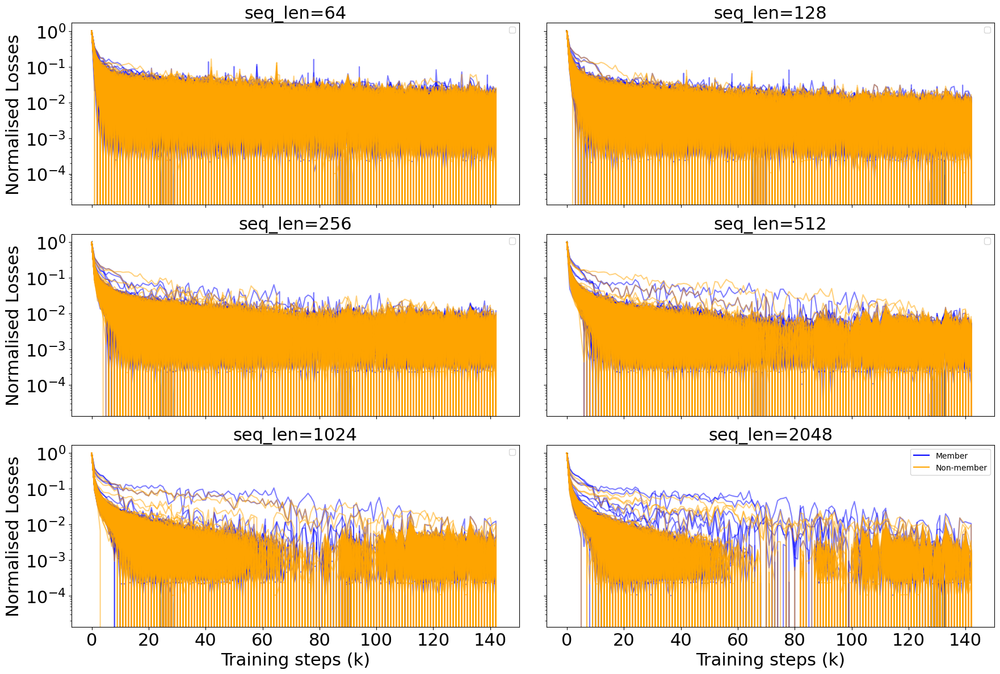

In [80]:
plot_indv_loss_curves(dataset_uspto_pythia160m_normalised, k_values, "USPTO Normalised Losses (Pythia 160m)")

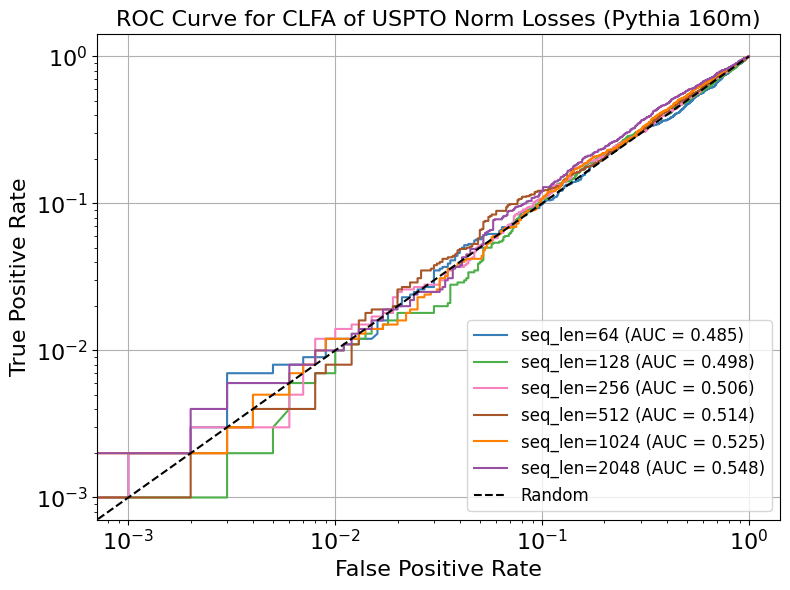

In [81]:
uspto_144_cp_norm_clfa_aucs, uspto_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_uspto_pythia160m_normalised, loss_columns, "USPTO Norm Losses (Pythia 160m)", target_fpr, True)

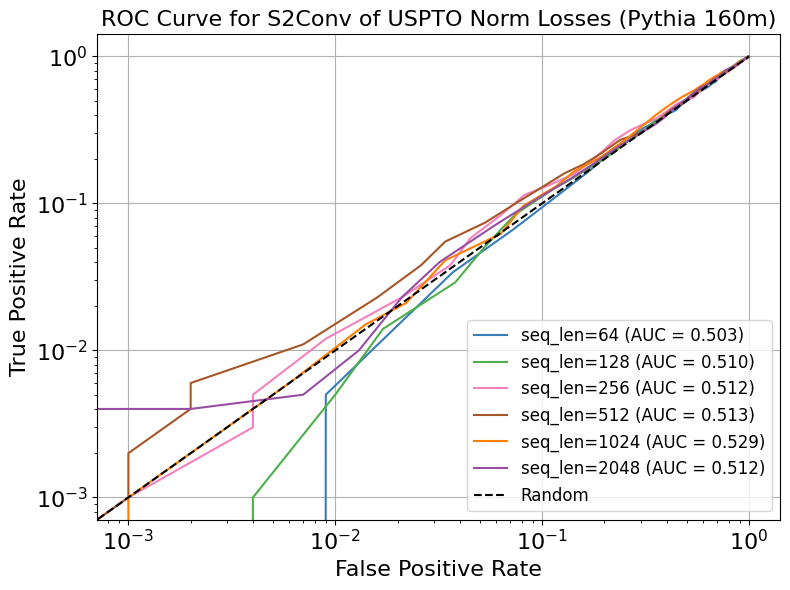

In [82]:
uspto_144_cp_norm_s2conv_aucs, uspto_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_uspto_pythia160m_normalised, loss_columns, "USPTO Norm Losses (Pythia 160m)", target_fpr )

## Pile-CC Pythia 160M (Pile-RS-Truncated)

In [19]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_pilecc_pythia160m = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/pilecc/pythia160m_processed/pile_reservoirv2_pilecc_seqlen{seqlen}_pythia-160m_processed.pkl", "rb") as f:
        dataset_pilecc_pythia160m[seqlen] = pd.read_pickle(f)


In [20]:
dataset_pilecc_pythia160m["seq_len=64"] = dataset_pilecc_pythia160m.pop(64)
dataset_pilecc_pythia160m["seq_len=128"] = dataset_pilecc_pythia160m.pop(128)
dataset_pilecc_pythia160m["seq_len=256"] = dataset_pilecc_pythia160m.pop(256)
dataset_pilecc_pythia160m["seq_len=512"] = dataset_pilecc_pythia160m.pop(512)
dataset_pilecc_pythia160m["seq_len=1024"] = dataset_pilecc_pythia160m.pop(1024)
dataset_pilecc_pythia160m["seq_len=2048"] = dataset_pilecc_pythia160m.pop(2048)

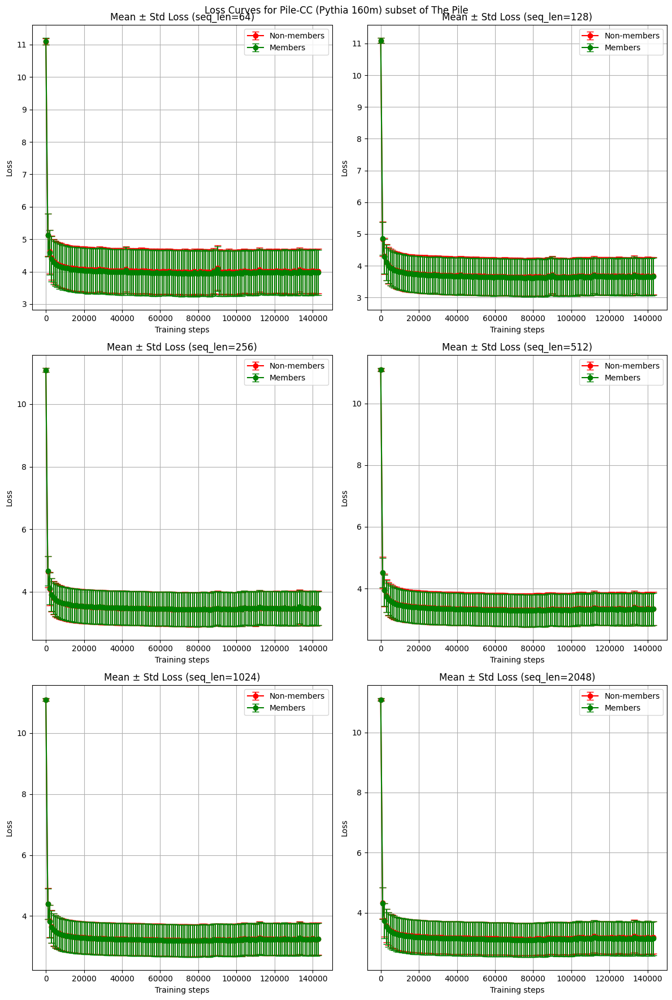

In [21]:
plot_loss_curves(dataset_pilecc_pythia160m, "Pile-CC (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


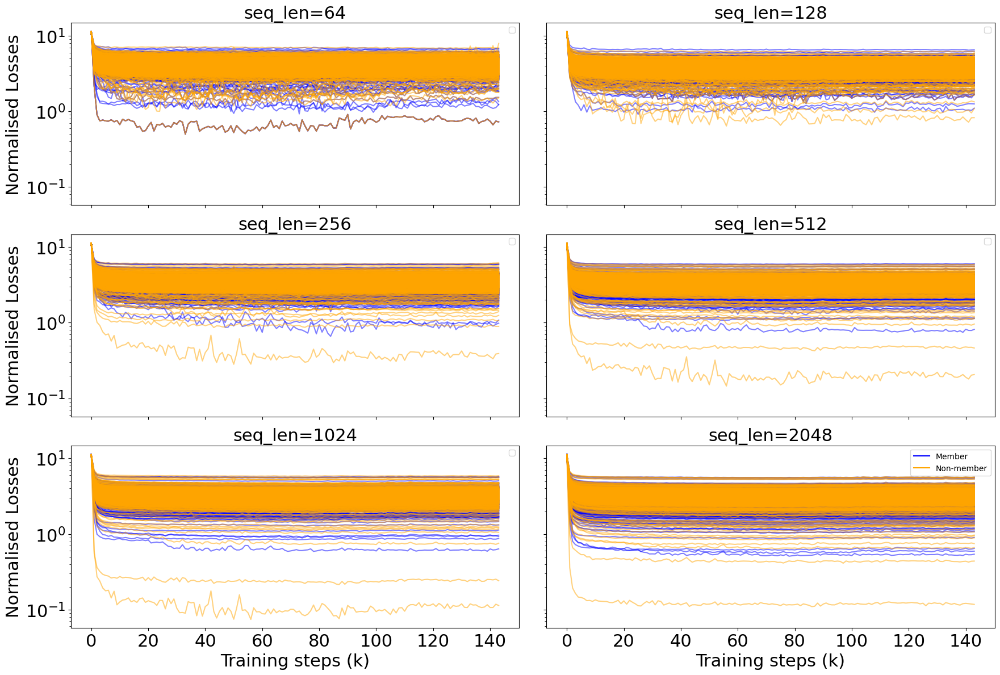

In [22]:
plot_indv_loss_curves(dataset_pilecc_pythia160m, k_values, dataset_name="Pile-CC (Pythia 160m)")

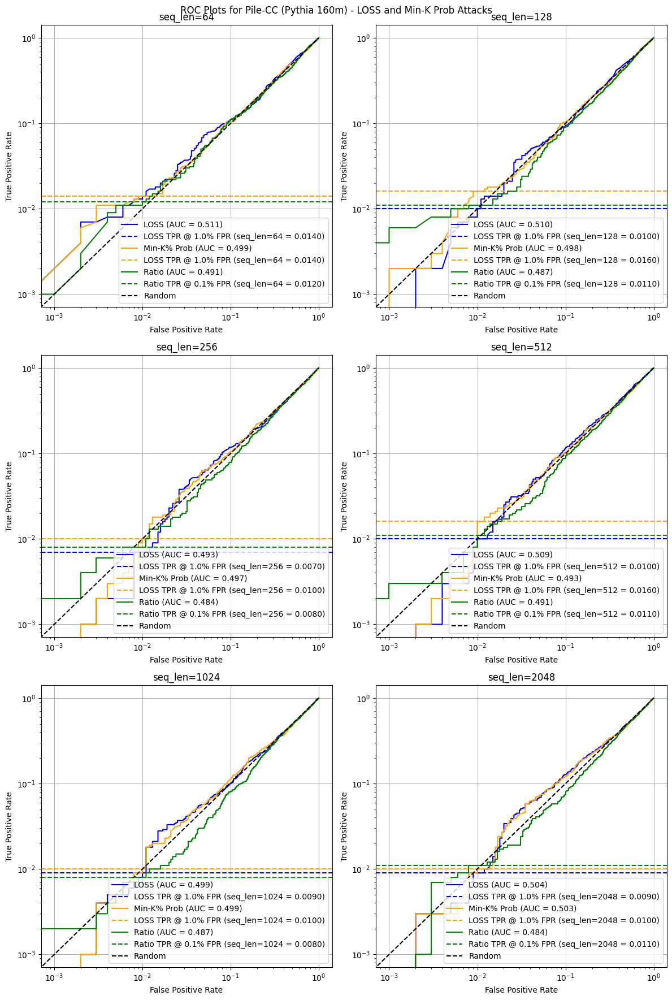

In [23]:
pilecc_loss_aucs, pilecc_loss_tpr_at_target, pilecc_minkprob_aucs, pilecc_minkprob_tpr_at_target, pilecc_ratio_aucs, pilecc_ratio_tpr_at_target = plot_roc_curves(dataset_pilecc_pythia160m, "Pile-CC (Pythia 160m)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

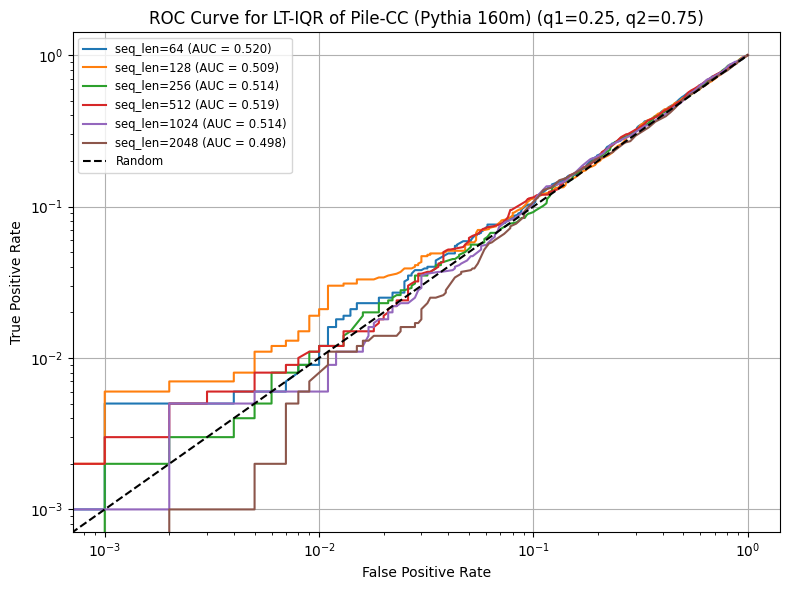

In [24]:
pilecc_144_cp_aucs, pilecc_144_cp_tpr = plot_roc_iqr_single_plot(dataset_pilecc_pythia160m, loss_columns, "Pile-CC (Pythia 160m)",target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

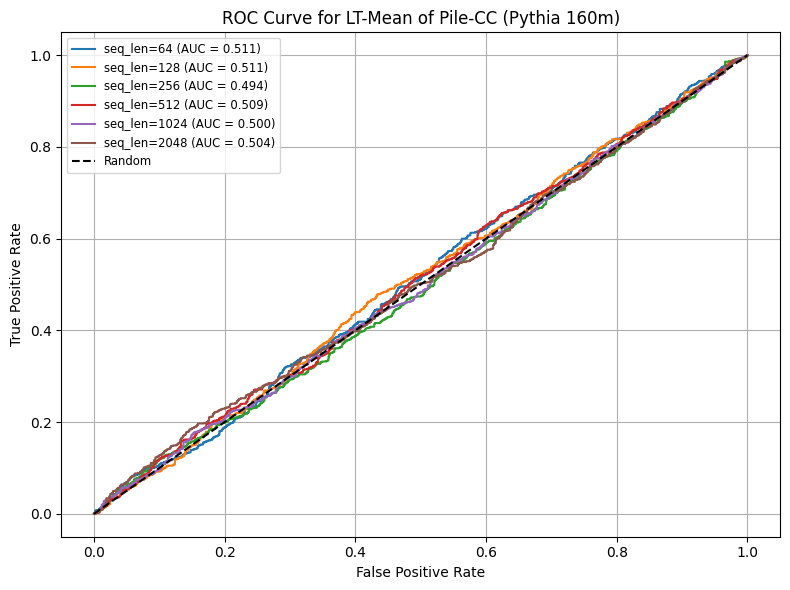

In [25]:
pilecc_144_cp_mean_aucs, pilecc_144_cp_mean_tprs = plot_loss_trace_mean(dataset_pilecc_pythia160m, loss_columns, "Pile-CC (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniqu

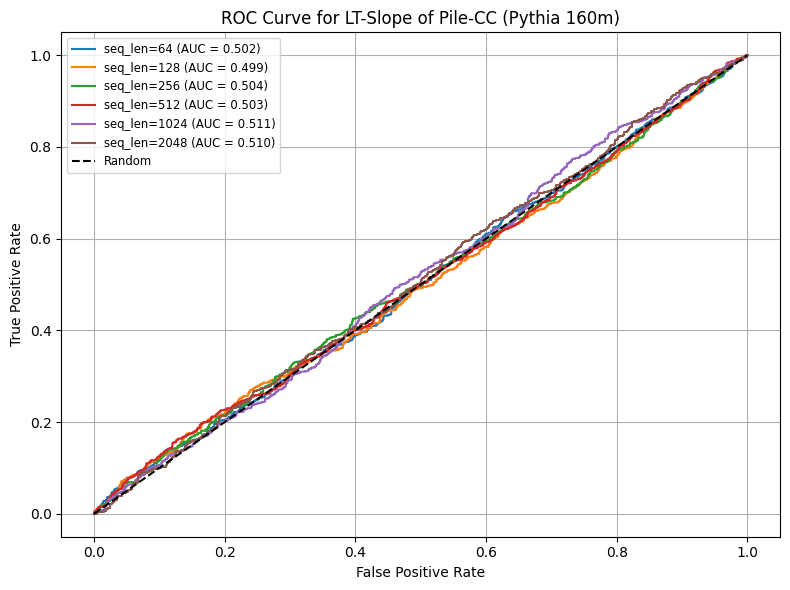

In [26]:
pilecc_144_cp_slope_aucs, pilecc_144_cp_slope_tprs = plot_loss_trace_slope(dataset_pilecc_pythia160m, loss_columns, "Pile-CC (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

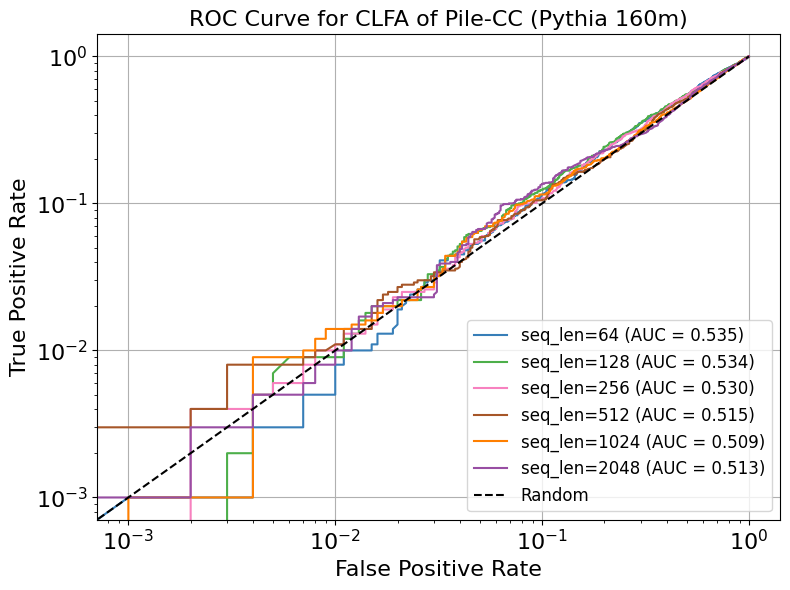

In [27]:
pilecc_144_cp_clfa_aucs, pilecc_144_cp_clfa_tprs = plot_clfa_normalized(dataset_pilecc_pythia160m, loss_columns, "Pile-CC (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documen

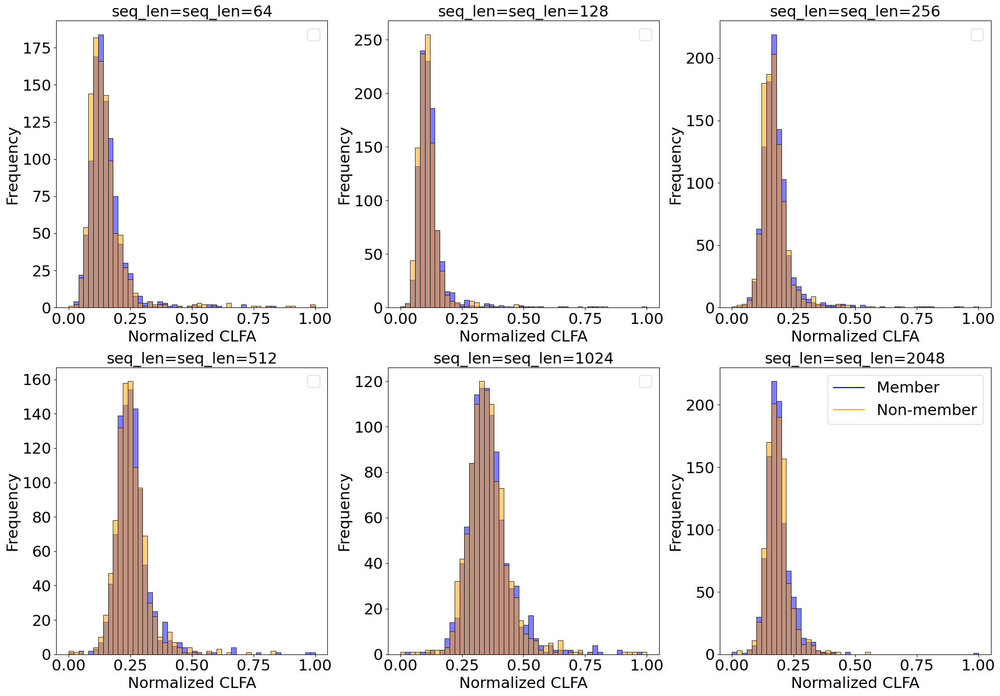

In [28]:
plot_clfa_norm_distribution(dataset_pilecc_pythia160m, "Pile-CC (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/che

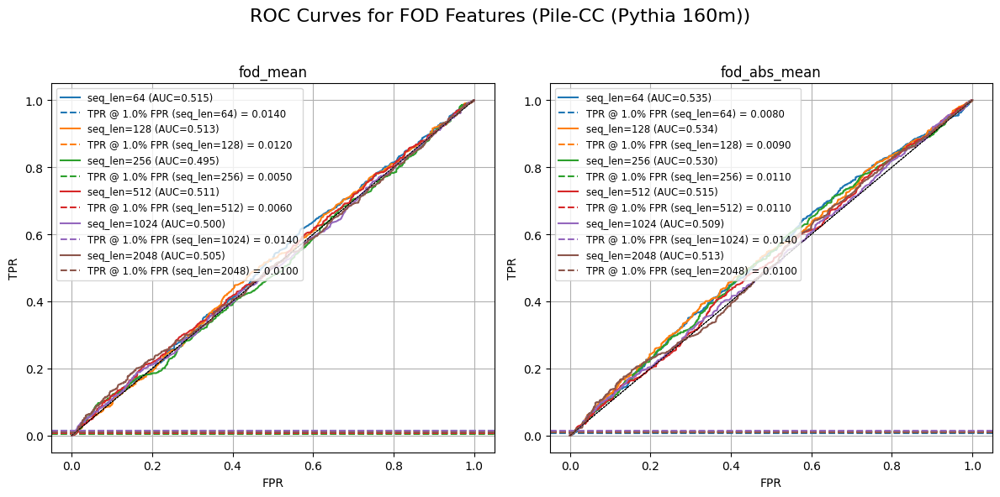

In [29]:
pilecc_144_fod_mean, pilecc_144_fod_mean_tpr, pilecc_144_fod_abs_mean, pilecc_144_fod_abs_mean_tpr = plot_fod(dataset_pilecc_pythia160m, "Pile-CC (Pythia 160m)", loss_columns, target_fpr)

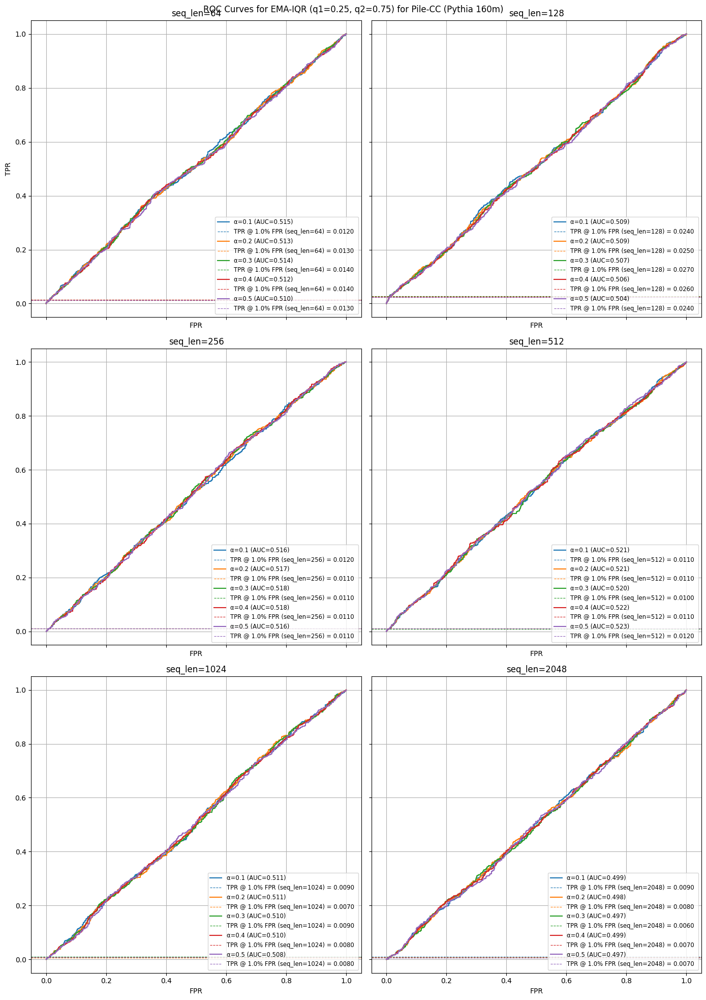

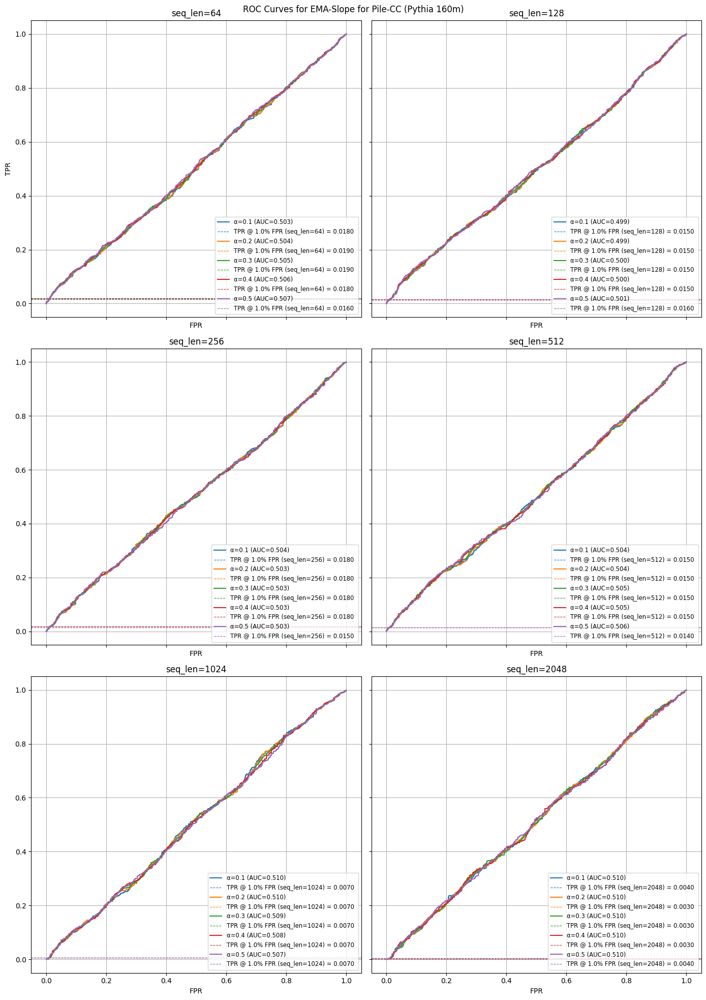

In [30]:
dataset_ema_pilecc_144_pythia160m = {}
pilecc_144_cp_ema_iqr_aucs, pilecc_144_cp_ema_iqr_tprs, pilecc_144_cp_ema_slope_aucs, pilecc_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_pilecc_pythia160m, dataset_ema_pilecc_144_pythia160m, "Pile-CC (Pythia 160m)", loss_columns, target_fpr)

### Normalised Loss Traces (Pile-CC 160M)

In [31]:
dataset_pilecc_pythia160m_normalised = normalize_loss_dfs(dataset_pilecc_pythia160m, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


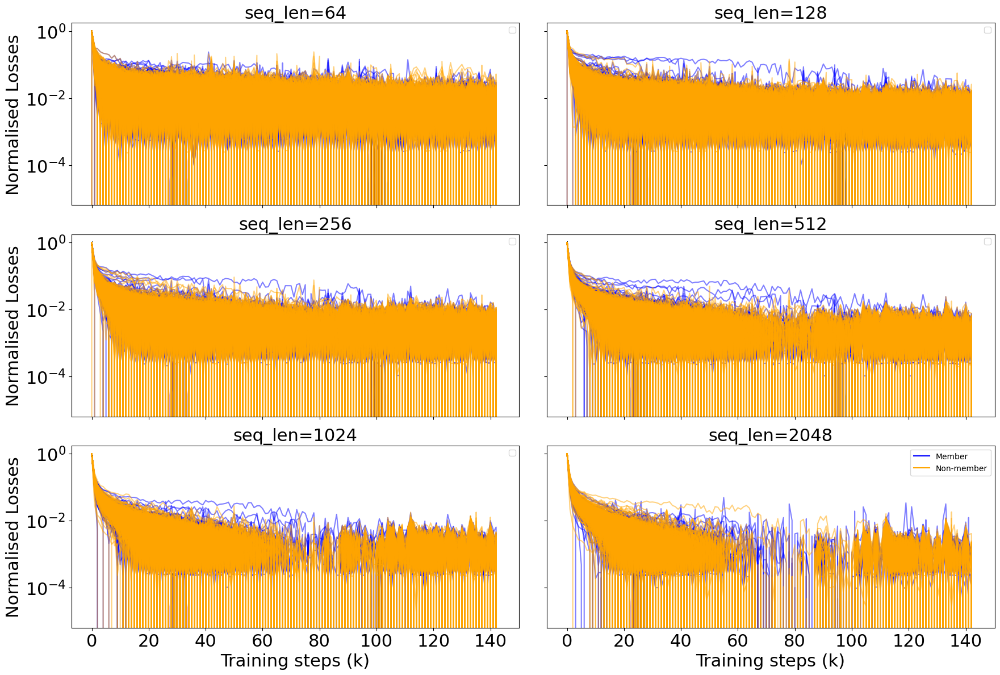

In [32]:
plot_indv_loss_curves(dataset_pilecc_pythia160m_normalised, k_values, "Pile-CC Normalised Losses (Pythia 160m)")

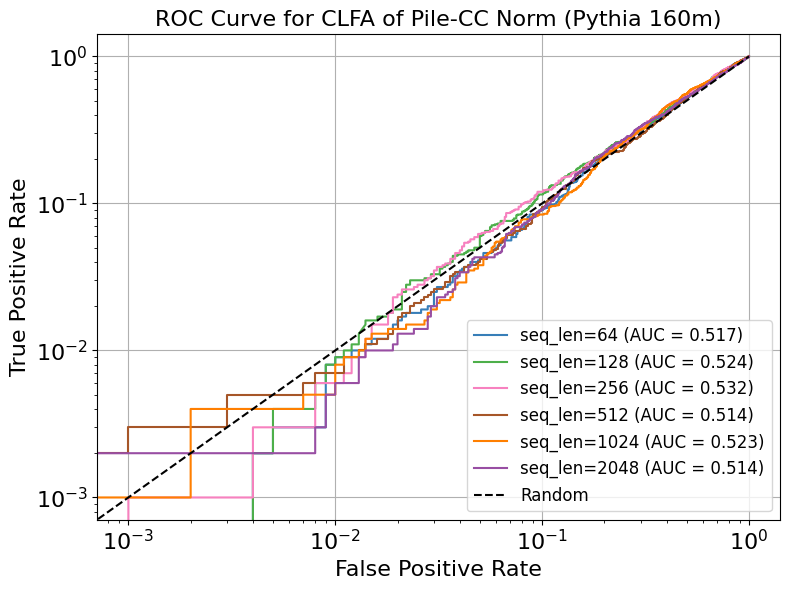

In [33]:
pilecc_144_cp_norm_clfa_aucs, pilecc_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_pilecc_pythia160m_normalised, loss_columns, "Pile-CC Norm (Pythia 160m)", target_fpr, True)

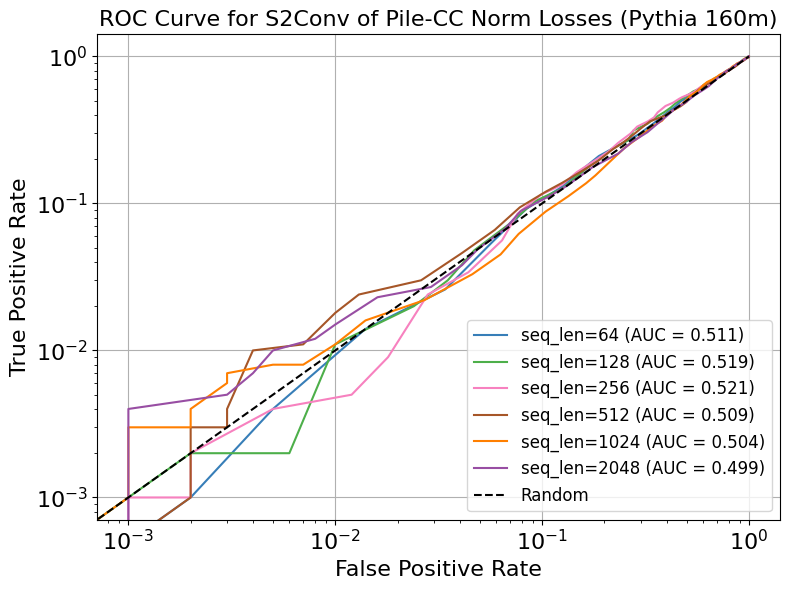

In [34]:
pilecc_144_cp_norm_s2conv_aucs, pilecc_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_pilecc_pythia160m_normalised, loss_columns, "Pile-CC Norm Losses (Pythia 160m)", target_fpr )

## Github Pythia 160M (Pile-RS-Truncated)

In [35]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_github_pythia160m = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/github/pythia160m_processed/pile_reservoirv2_github_seqlen{seqlen}_pythia-160m_processed.pkl", "rb") as f:
        dataset_github_pythia160m[seqlen] = pd.read_pickle(f)


In [36]:
dataset_github_pythia160m["seq_len=64"] = dataset_github_pythia160m.pop(64)
dataset_github_pythia160m["seq_len=128"] = dataset_github_pythia160m.pop(128)
dataset_github_pythia160m["seq_len=256"] = dataset_github_pythia160m.pop(256)
dataset_github_pythia160m["seq_len=512"] = dataset_github_pythia160m.pop(512)
dataset_github_pythia160m["seq_len=1024"] = dataset_github_pythia160m.pop(1024)
dataset_github_pythia160m["seq_len=2048"] = dataset_github_pythia160m.pop(2048)

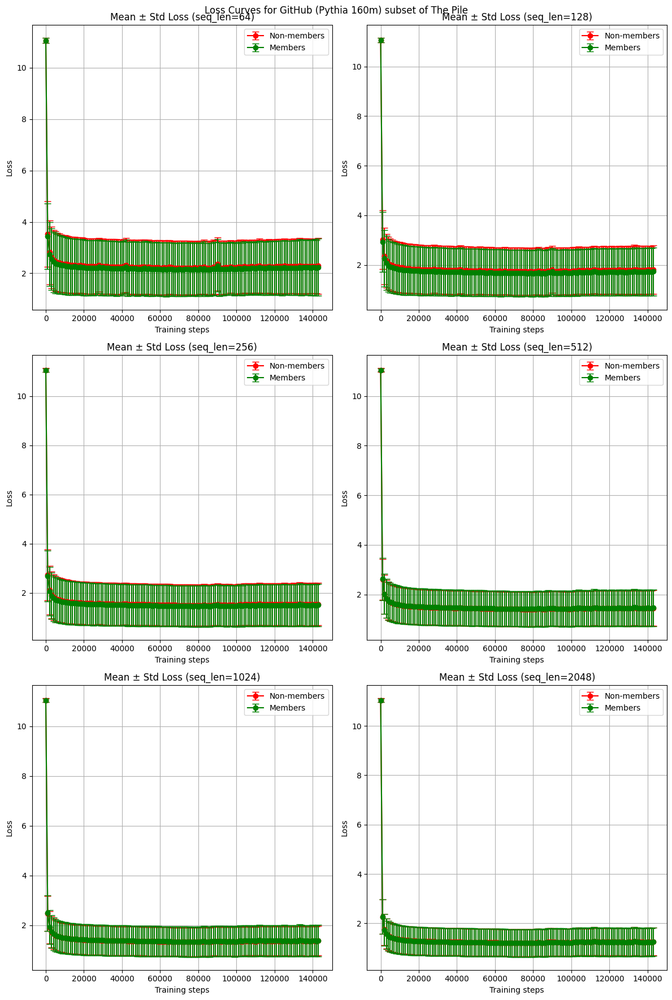

In [37]:
plot_loss_curves(dataset_github_pythia160m, "GitHub (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


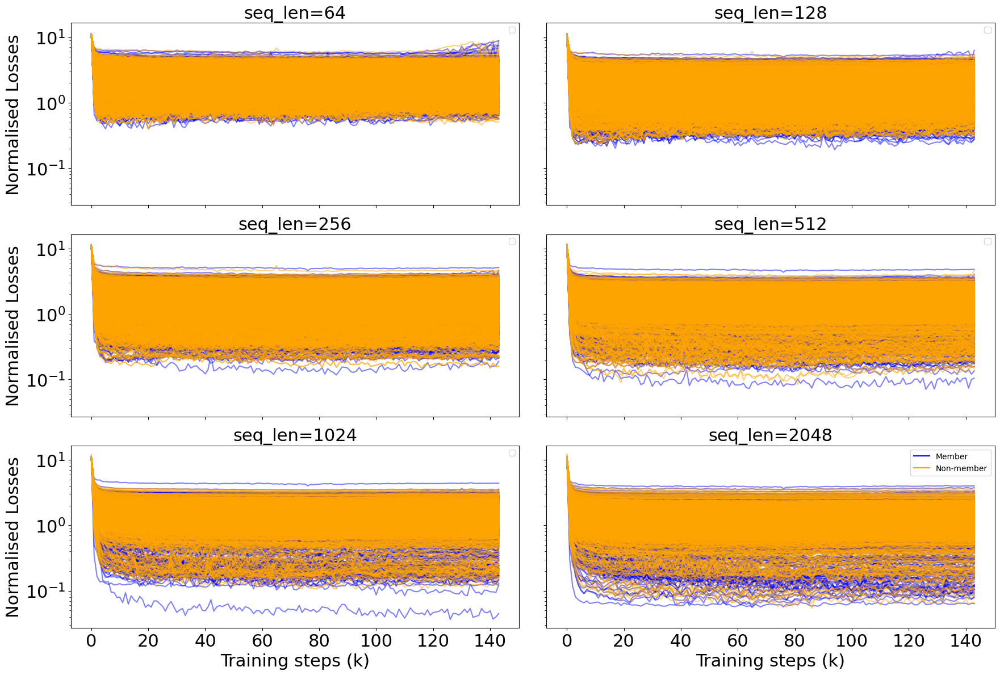

In [38]:
plot_indv_loss_curves(dataset_github_pythia160m, k_values, dataset_name="GitHub (Pythia 160m)")

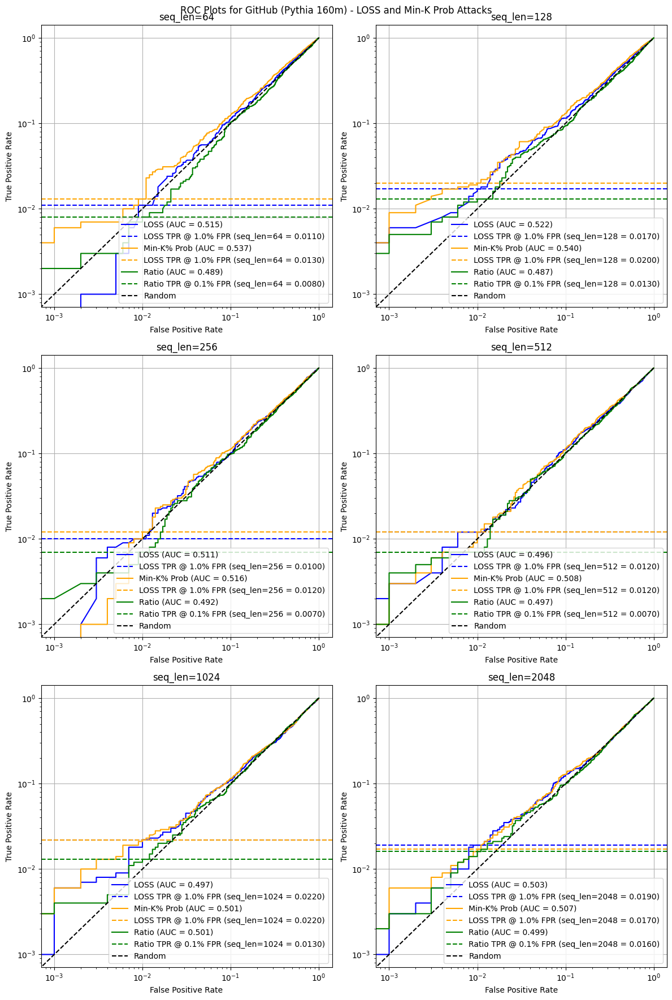

In [39]:
github_loss_aucs, github_loss_tpr_at_target, github_minkprob_aucs, github_minkprob_tpr_at_target, github_ratio_aucs, github_ratio_tpr_at_target =plot_roc_curves(dataset_github_pythia160m, "GitHub (Pythia 160m)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

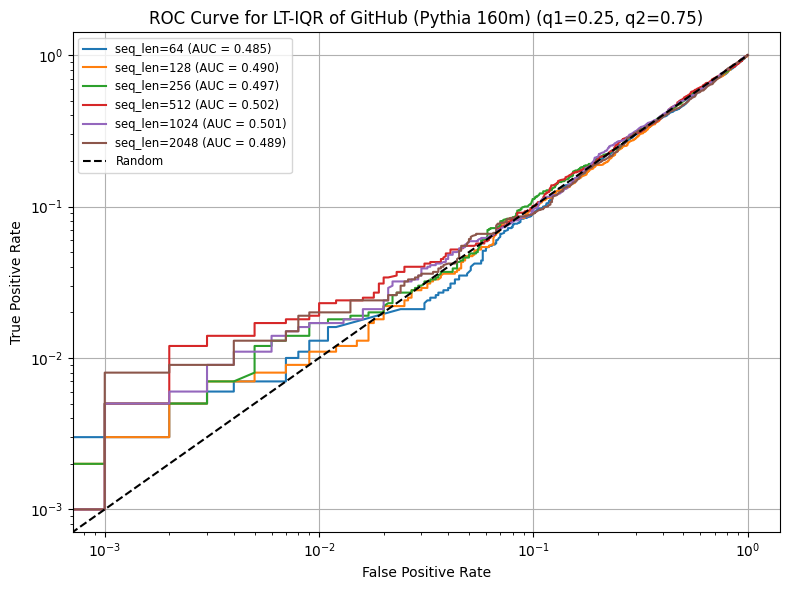

In [40]:
github_144_cp_aucs, github_144_cp_tpr = plot_roc_iqr_single_plot(dataset_github_pythia160m, loss_columns, "GitHub (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_mean'] = mean_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

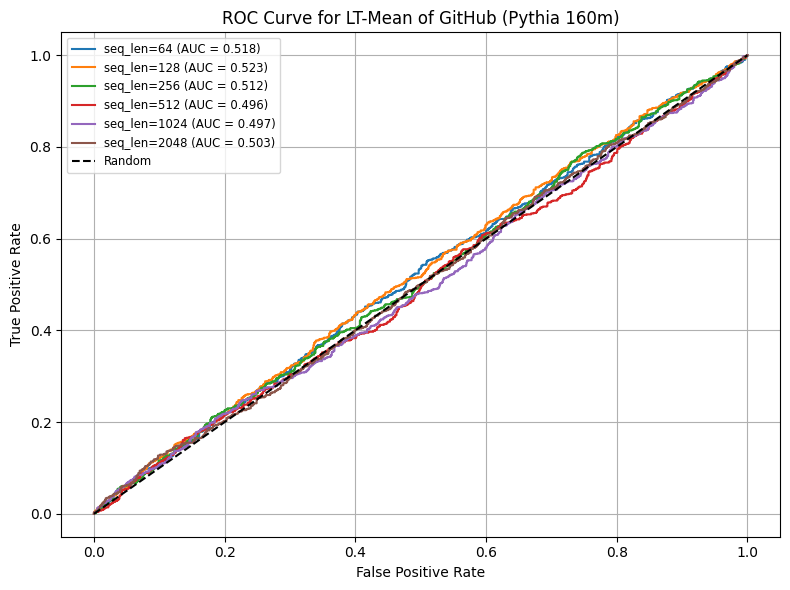

In [41]:
github_144_cp_mean_aucs, github_144_cp_mean_tprs = plot_loss_trace_mean(dataset_github_pythia160m, loss_columns, "GitHub (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['loss_trace_slope'] = slope_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniqu

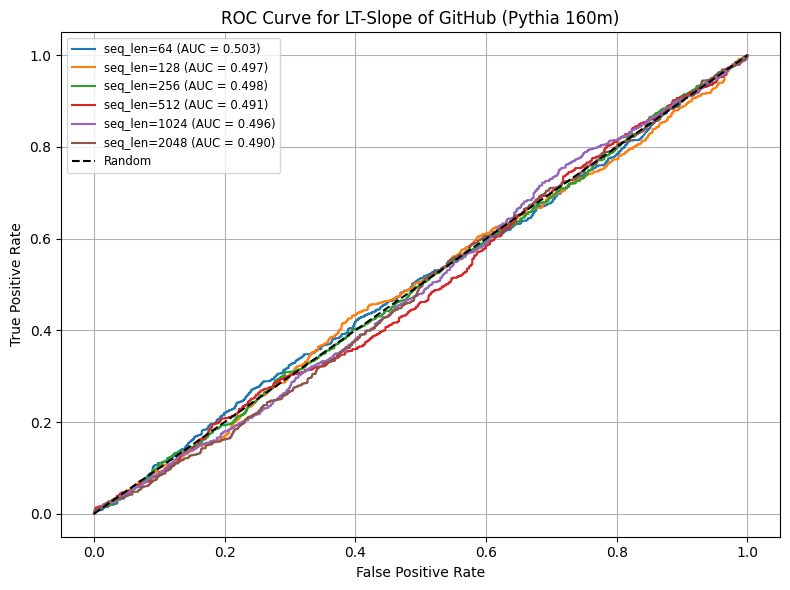

In [42]:
github_144_cp_slope_aucs, github_144_cp_slope_tpr = plot_loss_trace_slope(dataset_github_pythia160m, loss_columns, "GitHub (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

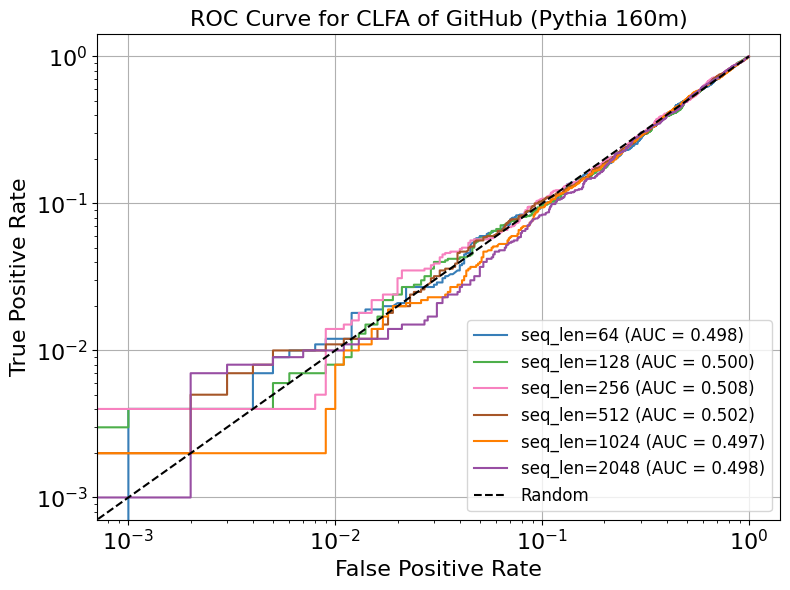

In [43]:
github_144_cp_clfa_aucs, github_144_cp_clfa_tprs = plot_clfa_normalized(dataset_github_pythia160m, loss_columns, "GitHub (Pythia 160m)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=22)
/Users/ongsici/Documen

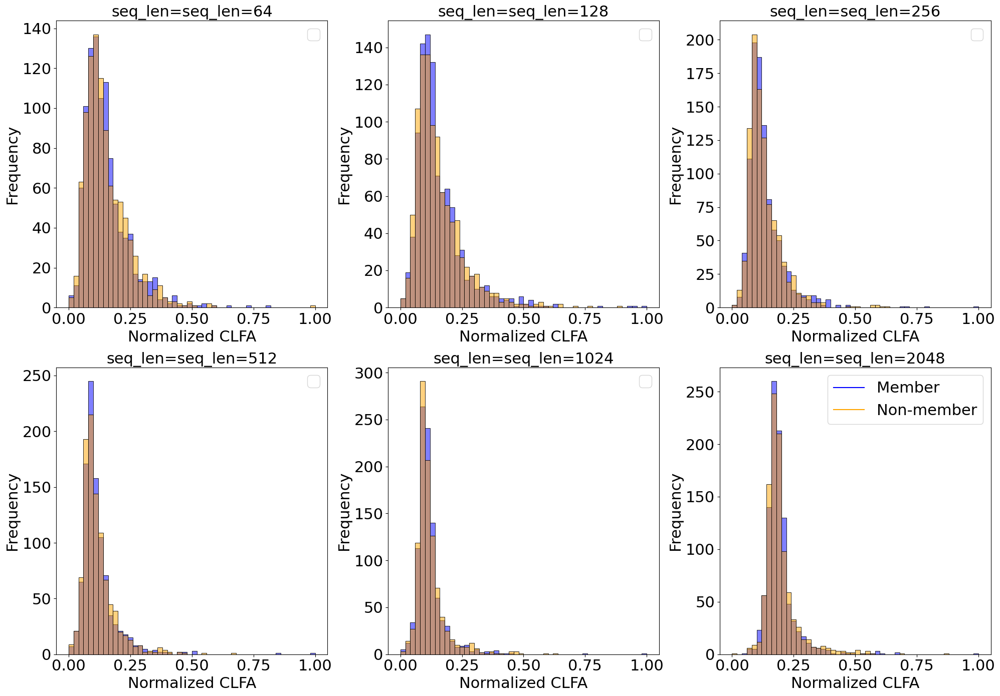

In [44]:
plot_clfa_norm_distribution(dataset_github_pythia160m, "GitHub (Pythia 160m)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_mean'] = fod_stats['fod_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['fod_abs_mean'] = fod_stats['fod_abs_mean_diff']
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/che

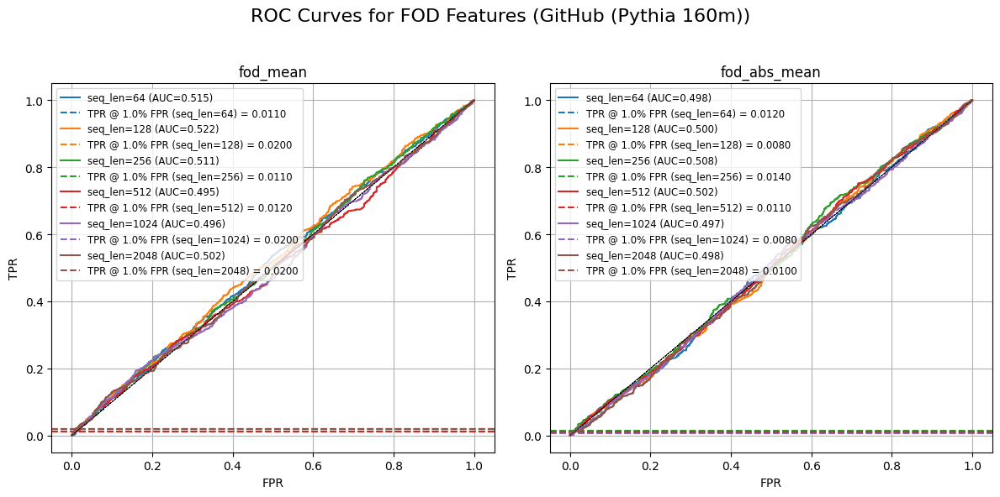

In [45]:
github_144_fod_mean, github_144_fod_mean_tpr, github_144_fod_abs_mean, github_144_fod_abs_mean_tpr = plot_fod(dataset_github_pythia160m, "GitHub (Pythia 160m)", loss_columns, target_fpr)

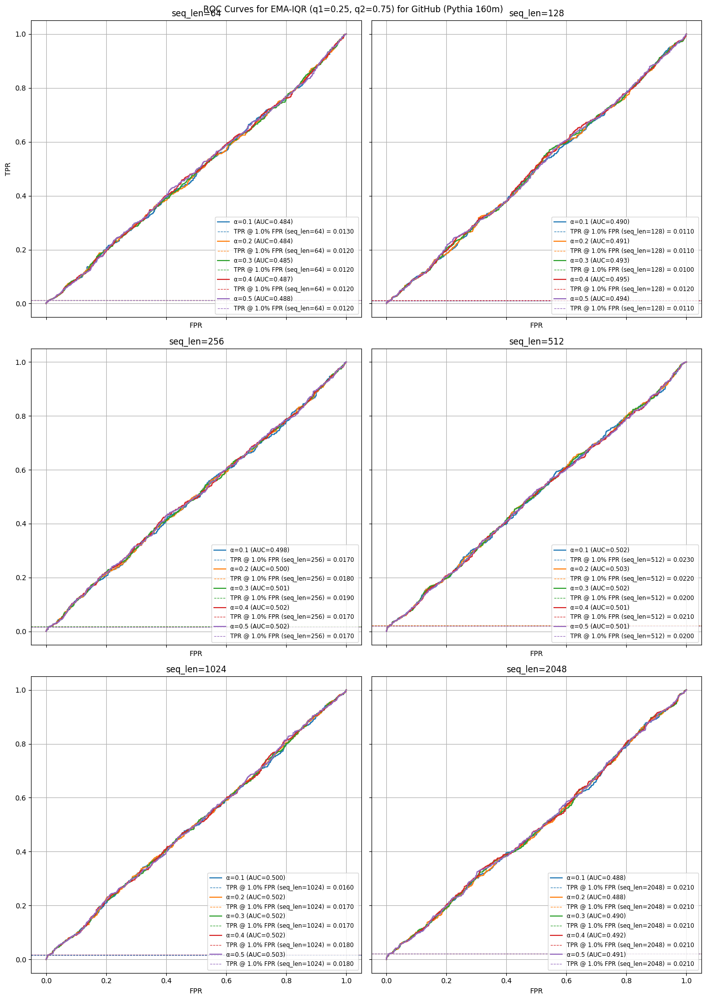

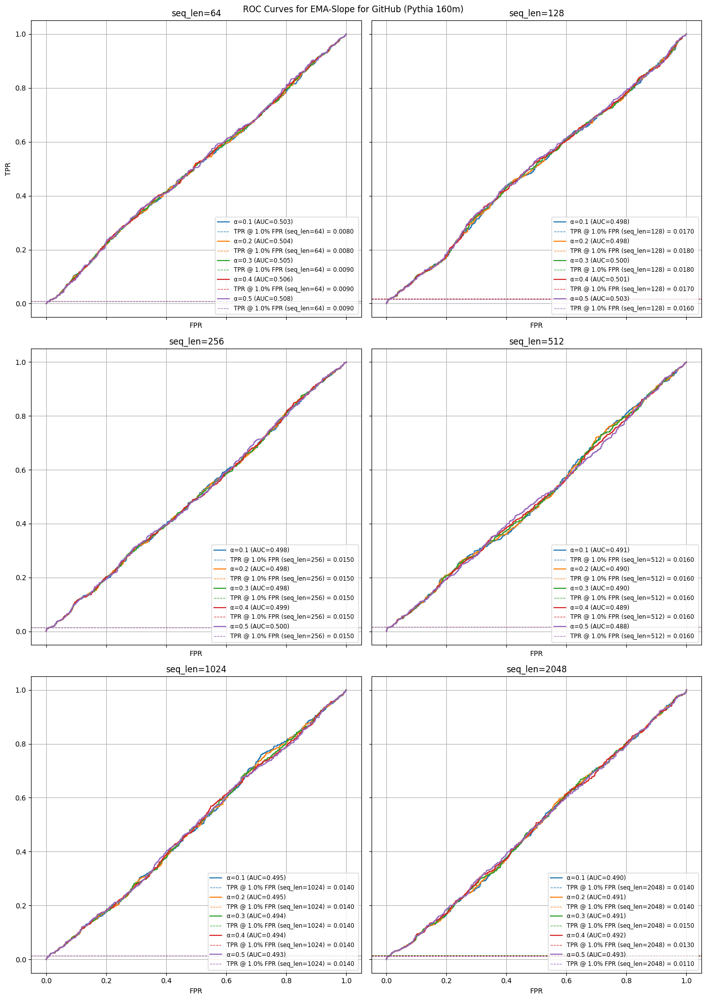

In [46]:
dataset_ema_github_144_pythia160m = {}
github_144_cp_ema_iqr_aucs, github_144_cp_ema_iqr_tprs, github_144_cp_ema_slope_aucs, github_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_github_pythia160m, dataset_ema_github_144_pythia160m, "GitHub (Pythia 160m)", loss_columns, target_fpr)

### Normalised Loss Traces (Github 160M)

In [47]:
dataset_github_pythia160m_normalised = normalize_loss_dfs(dataset_github_pythia160m, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


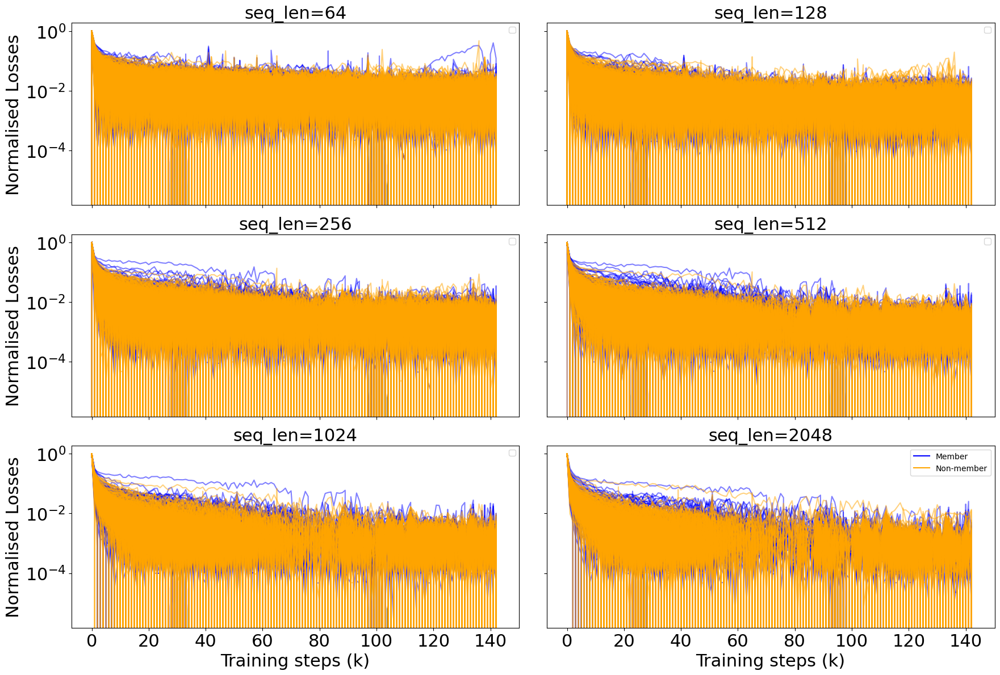

In [48]:
plot_indv_loss_curves(dataset_github_pythia160m_normalised, k_values, "GitHub Normalised Losses (Pythia 160m)")

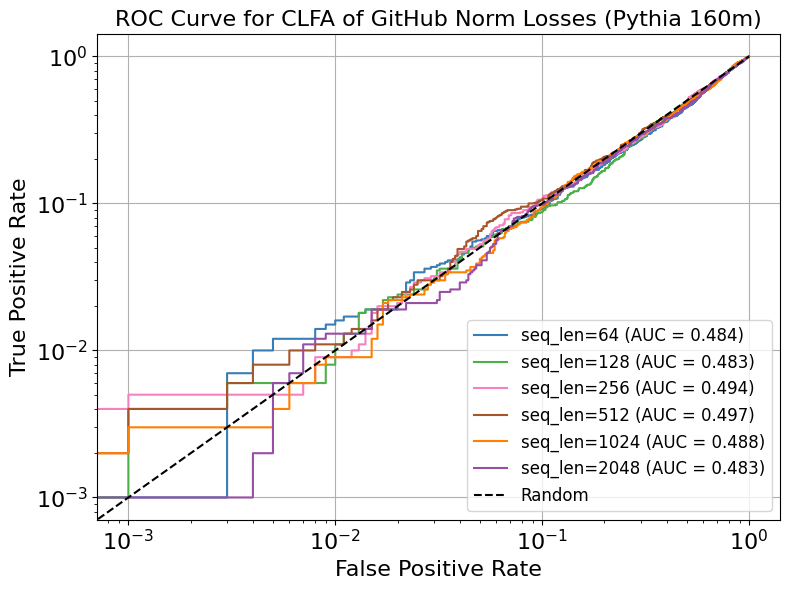

In [49]:
github_144_cp_norm_clfa_aucs, github_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_github_pythia160m_normalised, loss_columns, "GitHub Norm Losses (Pythia 160m)", target_fpr, True)

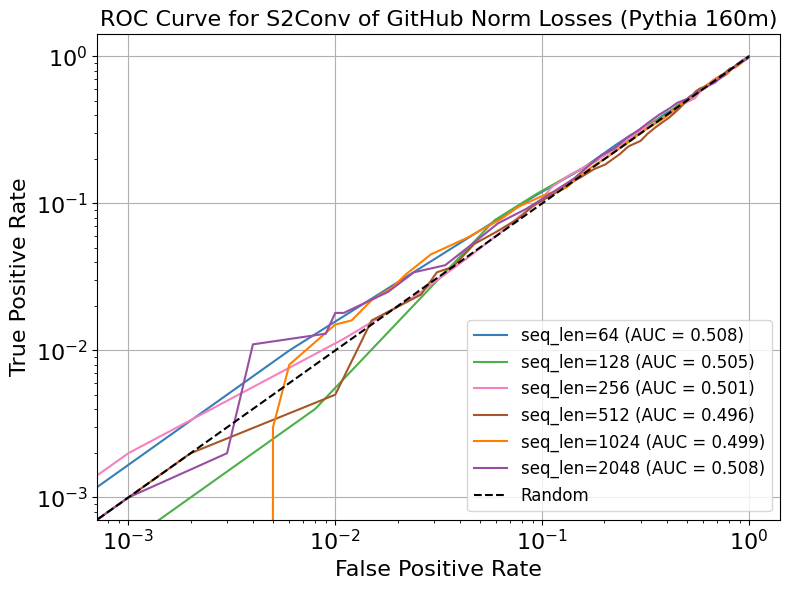

In [50]:
github_144_cp_norm_s2conv_aucs, github_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_github_pythia160m_normalised, loss_columns, "GitHub Norm Losses (Pythia 160m)", target_fpr )